## Initialization

In [64]:
%reload_ext autoreload
%autoreload 2

import sys
sys.path.append("..")

import numpy as np
import healpy as hp
from healpy.newvisufunc import projview, newprojplot
from astropy.io import fits
from pprint import pprint
from tqdm import tqdm
import pickle
import corner
import os

from scipy import optimize
from scipy.stats import poisson

import jax
import jax.numpy as jnp

%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc_file('../utils/matplotlibrc')

from utils import ed_fcts_amarel as ef
from utils import create_mask as cm
from utils import ed_plotting as eplt

# load GPU
gpu_id = '1'
os.environ['XLA_PYTHON_CLIENT_PREALLOCATE'] = 'false'
os.environ['CUDA_VISIBLE_DEVICES'] = gpu_id

In [65]:
# standard settings
nside = 128
ebin = 10
temp_names_sim = ['iso', 'psc', 'bub', 'pib', 'ics', 'blg', 'nfw']
all_temp_names = ['iso', 'psc', 'bub', 'pib', 'ics', 'blg', 'gp', 'nfw', 'dsk']
ccodes = ['C0', 'C1', 'C2', 'C3', 'C4', 'C5', 'C5', 'C6', 'C7']
n_pixels = 160 # no longer can control this since we load cartesian maps beforehand

# label best models (dif_names ordered from 0 - 79)
roman_nums_arr = [ef.int_to_Roman(i) for i in range(1,80+1)]
best_models_rom = ['X', 'XV', 'XLVIII', 'XLIX', 'LIII']
model_names = ['O'] + best_models_rom
best_models = [roman_nums_arr.index(r) + 1 for r in best_models_rom]

# control speed by modifying resolution of healpix plots
xsize = 2000 # 2000 is our best choice (but slow)

# load masks
mask_p, mask, outer_mask, total_mask, mask_40 = pickle.load(open('data/masks.p', 'rb'))

### Figure 1
`src: gce-gp/figures/appendix_figures.ipynb`

In [66]:
# load data
temp_dict, temp_sample_dict_1, temp_sample_dict_2, losses_1, ll_list_1, losses_2, ll_list_2, rx1, rx2  = pickle.load(open('data/appdata_degeneracy.p', 'rb'))

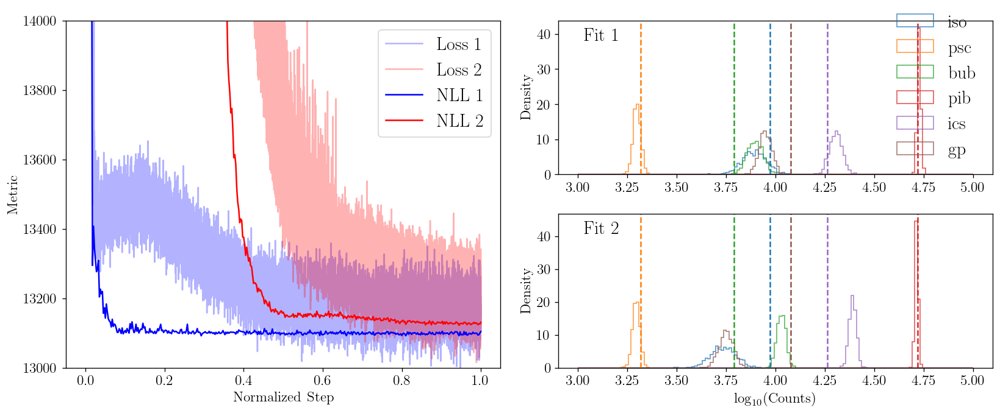

In [67]:
fig = plt.figure(figsize=(14,6), dpi= 120)

ax11 = plt.subplot2grid((2, 2), (0, 0), rowspan = 2)
ax21 = plt.subplot2grid((2, 2), (0, 1), rowspan = 1)
ax22 = plt.subplot2grid((2, 2), (1, 1), rowspan = 1)

# note requires predictive distribution, which was loaded two cells up
Nstep1 = len(losses_1)
Nstep2 = len(losses_2)

x1 = np.arange(1, Nstep1 + 1) / Nstep1
x2 = np.arange(1, Nstep2 + 1) / Nstep2
# rx1, rx2 are pre-loaded

plt.axes(ax11)
plt.plot(x1, losses_1, label = 'Loss 1', c = 'b', alpha = 0.3)
plt.plot(x2, losses_2, label = 'Loss 2', c = 'r', alpha = 0.3)
plt.plot(rx1 , -ll_list_1, label = 'NLL 1', c = 'b')  
plt.plot(rx2, -ll_list_2, label = 'NLL 2', c = 'r')
plt.ylim(13000,14000)
plt.legend()
plt.xlabel('Normalized Step')
plt.ylabel('Metric')

# plot total counts histogram
ef.tot_log_counts_hist(temp_sample_dict_1, temp_dict, temp_names_sim, mask = mask_p, bins = np.linspace(3.,5.,150), gp_model_nfw=True, gp_model_iso = False, ax = ax21)
ax21.text(0.1, 0.9, 'Fit 1', horizontalalignment = 'center', verticalalignment = 'center', transform = ax21.transAxes, fontsize = 18)
ax21.set_xlabel('')

ef.tot_log_counts_hist(temp_sample_dict_2, temp_dict, temp_names_sim, mask = mask_p, bins = np.linspace(3.,5.,150), gp_model_nfw=True, gp_model_iso = False, ax = ax22)
ax22.text(0.1, 0.9, 'Fit 2', horizontalalignment = 'center', verticalalignment = 'center', transform = ax22.transAxes, fontsize = 18)
ax22.get_legend().remove()

fig.tight_layout()
fig.savefig('appendix_figures/fig_degeneracy_lr.pdf', bbox_inches='tight')

## Figure 2
`src: /data/edr76/gce-gp/roi_scan/plotter_variation_scan_eff.ipynb`

In [68]:
# load data
outer_radius_list, q_dict = pickle.load(open('data/appdata_roi_outer_radius_scan.p', 'rb'))

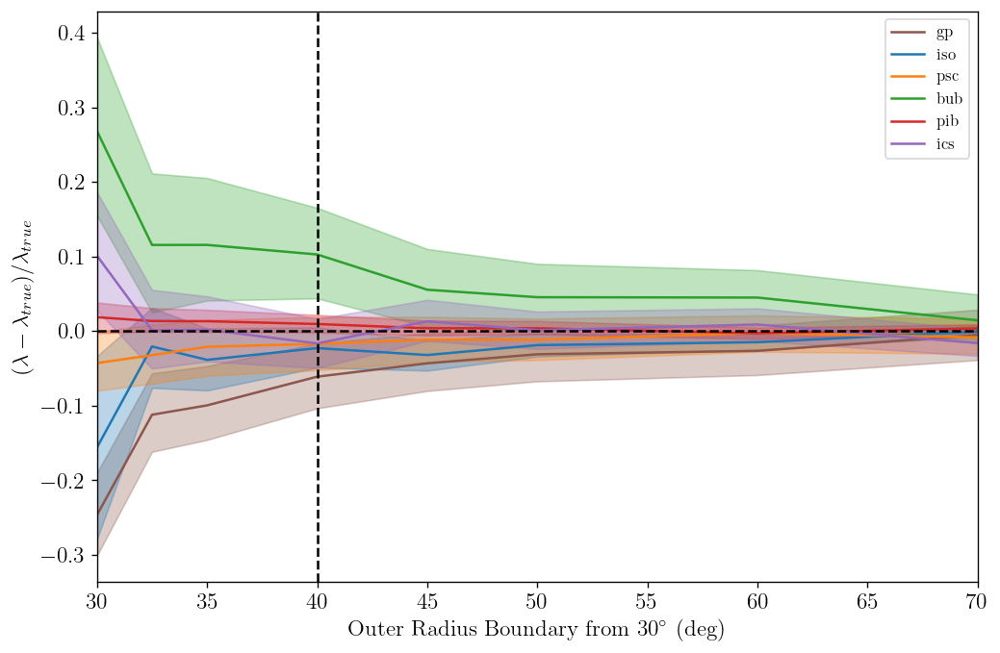

In [69]:
fig, ax = plt.subplots(figsize=(9,6), dpi= 120)
plt.axes(ax)
for name in list(q_dict.keys()):
    idx = all_temp_names.index(name)
    ccode = ccodes[idx] # colors chosen to match colored hist plots
    plt.plot(outer_radius_list, q_dict[name][1], label=name, color = ccode)
    plt.fill_between(outer_radius_list, q_dict[name][0], q_dict[name][2], alpha=0.3, color = ccode)
plt.legend(fontsize = 10)
plt.xlabel('Outer Radius Boundary from $30^{\circ}$ (deg)')
plt.ylabel('$(\\lambda - \\lambda_{true}) / \\lambda_{true}$')
plt.axvline(x = 40, color = 'black', linestyle = '--')
plt.axhline(y = 0, color = 'black', linestyle = '--')
plt.xlim(30, 70)

plt.tight_layout()
plt.savefig('appendix_figures/fig_outer_roi_scan.pdf', bbox_inches='tight')

## Figure 3
`src: /data/edr76/gce-gp/roi_scan/plotter_variation_scan_eff.ipynb`

In [70]:
# load data
inner_radius_list_1, q_dict_1 = pickle.load(open('../figures/data/appdata_roi_inner_radius_scan_upto40.p', 'rb'))
inner_radius_list_2, q_dict_2 = pickle.load(open('../figures/data/appdata_roi_inner_radius_scan_upto70.p', 'rb'))

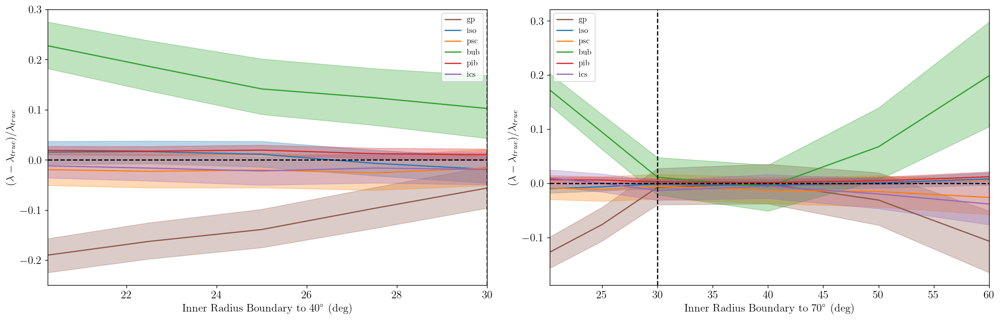

In [71]:
fig, axes = plt.subplots(figsize=(18,6), dpi= 120, ncols = 2)

inner_radius_lists = [inner_radius_list_1, inner_radius_list_2]
q_dicts = [q_dict_1, q_dict_2]
inner_radius_bdry = [40, 70]

for i in range(2):
    plt.axes(axes[i])
    inner_radius_list = inner_radius_lists[i]
    q_dict = q_dicts[i]
    for name in list(q_dict.keys()):
        idx = all_temp_names.index(name)
        ccode = ccodes[idx] # colors chosen to match colored hist plots
        plt.plot(inner_radius_list, q_dict[name][1], label=name, color = ccode)
        plt.fill_between(inner_radius_list, q_dict[name][0], q_dict[name][2], alpha=0.3, color = ccode)
    plt.legend(fontsize = 10)
    plt.xlabel('Inner Radius Boundary to ' + str(inner_radius_bdry[i]) + '$^{\circ}$ (deg)')
    plt.ylabel('$(\\lambda - \\lambda_{true}) / \\lambda_{true}$')
    plt.axvline(x = 30, color = 'black', linestyle = '--')
    plt.axhline(y = 0, color = 'black', linestyle = '--')
    plt.xlim(20.25, inner_radius_bdry[i] - 10)

fig.tight_layout()
plt.savefig('appendix_figures/fig_buffer_scan.pdf', bbox_inches='tight')

## Figure 4
`src: /data/edr76/gce-gp/data_processing/yitian_bubbles_concat.ipynb`

In [72]:
# load data
bubbles_1, bubbles_2, bubbles_3 = pickle.load(open('../figures/data/app_bubbles.p', 'rb'))

/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:407: UserWarning: 
 *** Overriding default plot properies: {'cbar_shrink': 0.6, 'cbar_pad': 0.05, 'cbar_label_pad': -8, 'cbar_tick_direction': 'out', 'vertical_tick_rotation': 90, 'figure_width': 8.5, 'figure_size_ratio': 0.63} ***
  warnings.warn(
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:411: UserWarning: 
 *** New plot properies: {'cbar_shrink': 0.6, 'cbar_pad': 0.1, 'cbar_label_pad': -8, 'cbar_tick_direction': 'out', 'vertical_tick_rotation': 90, 'figure_width': 8.5, 'figure_size_ratio': 0.63} ***
  warnings.warn("\n *** New plot properies: " + str(plot_properties) + " ***")
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:621: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_ticklabels(custom_xtick_labels, fontname=fontname)
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufu

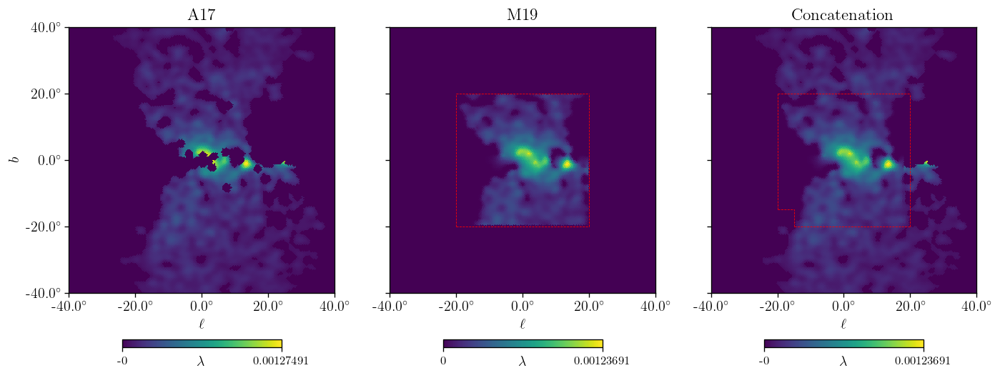

In [73]:
fig, ax_array = plt.subplots(figsize = (12,6), nrows = 1, ncols = 3)
ax1 = ax_array[0] ; ax2 = ax_array[1] ; ax3 = ax_array[2]

plt.axes(ax1)
m = bubbles_2
eplt.bub_map(m, title = 'A17', subplot = 131)
plt.xlim(np.deg2rad(-40),np.deg2rad(40))
plt.ylim(np.deg2rad(-40),np.deg2rad(40))

plt.axes(ax2)
m = bubbles_1
eplt.bub_map(m, title = 'M19', subplot = 132, display_y_info = False)
plt.xlim(np.deg2rad(-40),np.deg2rad(40))
plt.ylim(np.deg2rad(-40),np.deg2rad(40))

# add the boundary of template
plt.plot([-np.deg2rad(20), np.deg2rad(20)], [-np.deg2rad(20), -np.deg2rad(20)] , 'r--', lw = 0.5)
plt.plot([-np.deg2rad(20), np.deg2rad(20)], [np.deg2rad(20), np.deg2rad(20)] , 'r--', lw = 0.5)
plt.plot([-np.deg2rad(20), -np.deg2rad(20)], [-np.deg2rad(20), np.deg2rad(20)] , 'r--', lw = 0.5)
plt.plot([np.deg2rad(20), np.deg2rad(20)], [-np.deg2rad(20), np.deg2rad(20)] , 'r--', lw = 0.5)

plt.axes(ax3)
m = bubbles_3
eplt.bub_map(m, title = 'Concatenation', subplot = 133, display_y_info = False)
plt.xlim(np.deg2rad(-40),np.deg2rad(40))
plt.ylim(np.deg2rad(-40),np.deg2rad(40))

# add the concatenation boundary
plt.plot([-np.deg2rad(20), np.deg2rad(20)], [np.deg2rad(20), np.deg2rad(20)] , 'r--', lw = 0.5)
plt.plot([-np.deg2rad(20), -np.deg2rad(20)], [-np.deg2rad(15), np.deg2rad(20)] , 'r--', lw = 0.5)
plt.plot([-np.deg2rad(15), np.deg2rad(20)], [-np.deg2rad(20), -np.deg2rad(20)] , 'r--', lw = 0.5)
plt.plot([-np.deg2rad(15), -np.deg2rad(15)], [-np.deg2rad(20), -np.deg2rad(15)] , 'r--', lw = 0.5)
plt.plot([-np.deg2rad(20), -np.deg2rad(15)], [-np.deg2rad(15), -np.deg2rad(15)] , 'r--', lw = 0.5)
plt.plot([np.deg2rad(20), np.deg2rad(20)], [-np.deg2rad(20), np.deg2rad(20)] , 'r--', lw = 0.5)

plt.tight_layout()
plt.savefig('appendix_figures/fig_bubbles.pdf', bbox_inches='tight')

## Figure 5
`src: /data/edr76/gce-gp/figures/inducing_points.ipynb`

In [74]:
# load data
xu_f, xu_f_r, u_sample, f_sample = pickle.load(open('data/appdata_inducing.p', 'rb'))

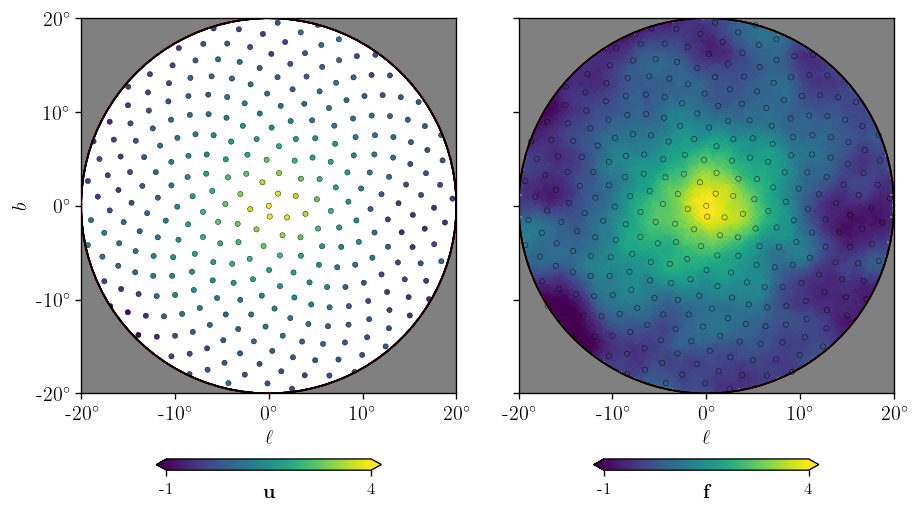

In [75]:
m = ef.convert_masked_array_to_hp_array(f_sample, mask, log_option = False, nside = 128)

fig, ax = plt.subplots(figsize=(8, 6), dpi= 120, nrows = 1, ncols = 2) 

plt.axes(ax[0])
eplt.inner_roi_map(m, title = None, vmin = -1, vmax = 4, subplot = 121, unit = '$\\mathbf{u}$')
circle1 = plt.Circle((0, 0), 20., color='white')
plt.gca().add_patch(circle1)
plt.scatter(xu_f_r[:,0], xu_f_r[:,1], c = u_sample, edgecolors = 'k', s = 10, lw = 0.25, cmap = 'viridis')
eplt.add_gray_region()

plt.axes(ax[1])
eplt.inner_roi_map(m, title = None, vmin = -1, vmax = 4, subplot = 122, unit = '$\\mathbf{f}$', display_y_info = False)
plt.scatter(xu_f_r[:,0], xu_f_r[:,1], facecolors = 'none', edgecolors = 'k', s = 10, lw = 0.25)

fig.tight_layout()
fig.savefig('appendix_figures/fig_inducing.pdf', bbox_inches='tight')

## Figure 6
`src: /data/edr76/gce-gp/notebooks/0b-sim_map_maker.ipynb`

In [76]:
# load data
samples, _ = pickle.load(open('data/appdata_syndata_samples.p', 'rb'))
temp_dict = np.load('data/appdata_syndata_temp_dict.npy', allow_pickle = True).item()

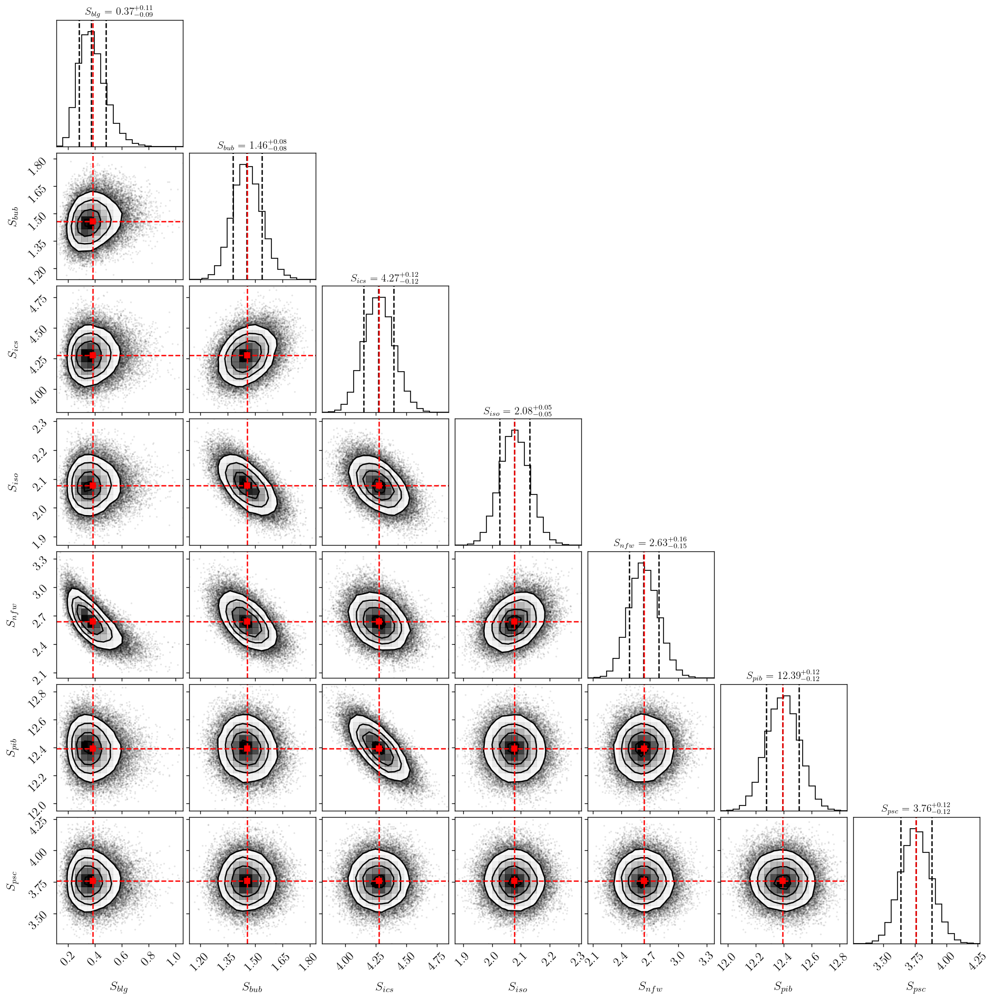

In [77]:
# generate corner plots
names = list(samples.keys())
labels = ef.gen_labels(names)
fig = ef.make_corner_plots(samples, with_mean_vlines = False, sim_vlines = True, temp_dict = temp_dict, labels = labels)
fig.savefig('appendix_figures/fig_syndata.pdf', bbox_inches='tight')

## Figure 7
`src: Amarel/scratch/vary_templates_mask/single_plots_vary_90_dr2_new.ipynbb
`

In [78]:
# load data
temp_dict, temp_samples = pickle.load(open('data/app_temp_extract.p', 'rb'))

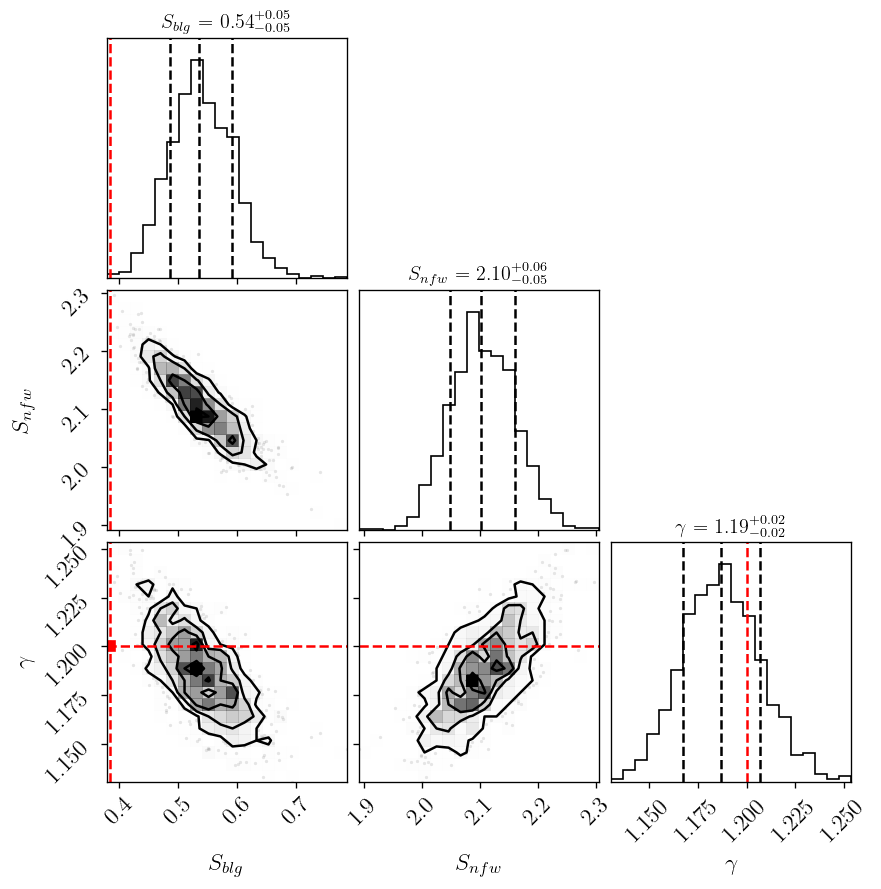

In [79]:
# gp fit background templates corner plot
names = list(temp_samples.keys())
labels = ef.gen_labels(names)
fig = ef.make_corner_plots(temp_samples, with_mean_vlines = False, sim_vlines = True, temp_dict = temp_dict, labels = labels)
fig.savefig('appendix_figures/fig_temp_extract.pdf', bbox_inches='tight')

## Figure 8 
`src: Amarel/scratch/vary_templates_mask/100_loader_opt_90_dr2.ipynb`

See comments below for issues in trying to group subfigures with `matplotlib` instead of MS powerpoint.

In [80]:
# load data
temp_dict, corner_samples, S_roc_runs, gp_roc_runs = pickle.load(open('data/app_poiss_summary.p', 'rb'))
n_actual_run = 100

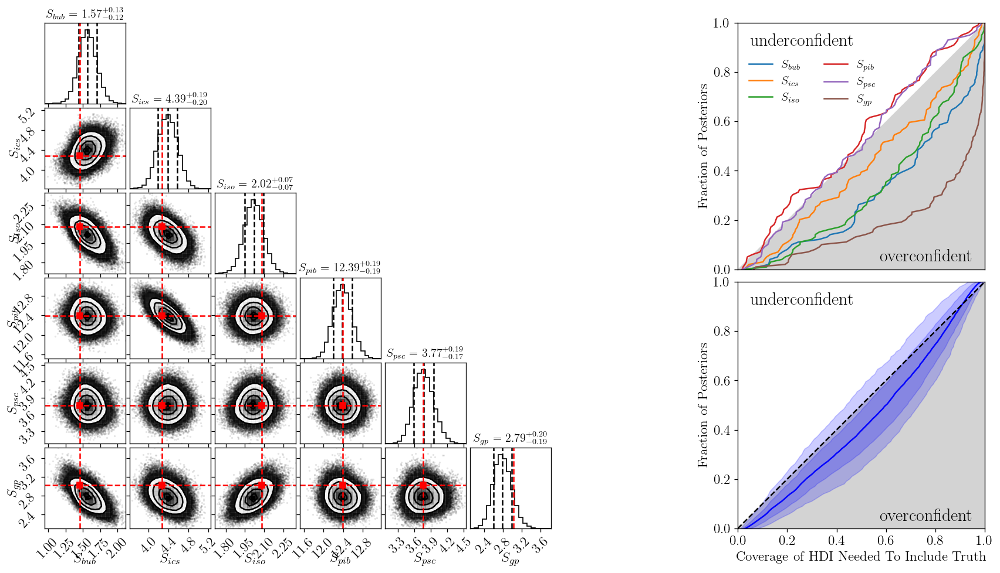

In [81]:
# Like some of the other figures, this one was easily made by making subfigures and grouping 
# them via powerpoint. The complication here is the corner plot requires large figsize and 
# the other figures give a lot of white space if we enforce aspect ratio to be equal.

# alternative would be to make three rows instead of of two

fig = plt.figure(figsize=(16,8), dpi= 120)
subfigs = fig.subfigures(1, 2, wspace=0)

labels = ef.gen_labels(list(corner_samples.keys()))
ef.make_corner_plots(corner_samples, with_mean_vlines = False, sim_vlines = True, temp_dict = temp_dict, labels = labels, fig = subfigs[0])

ax1 = plt.subplot2grid((2, 1), (0, 0), fig = subfigs[1])
ax2 = plt.subplot2grid((2, 1), (1, 0), fig = subfigs[1])

view_keys = list(corner_samples.keys())
linestyles = ['-', '--', ':', '-.']

ax1.fill_between([0,1], [0,1], color='lightgray')
for i, (k, roc) in enumerate(S_roc_runs.items()):
    if k in view_keys:
        label = ef.gen_labels([k])[0]
        ax1.plot(roc, np.linspace(0, 1, n_actual_run), label=label, color=f'C{i%10}', linestyle=linestyles[i//10])

ax1.set(aspect=1)
ax1.set(ylabel='Fraction of Posteriors')
ax1.set(xticks = [], xlim = (0,1), ylim = (0,1))
ax1.text(0.95, 0.05, 'overconfident', ha='right', va='center')
ax1.text(0.05, 0.925, 'underconfident', ha='left', va='center')
ax1.legend(bbox_to_anchor=(0.6,0.62), bbox_transform=ax1.transAxes, frameon=False, 
           ncol=2, fontsize = 12)

q_roc = np.percentile(gp_roc_runs, [2.5,16,50,84,97.5], axis = 0)
ax2.fill_between([0,1], [0,1], color='lightgray')
ax2.fill_betweenx(np.linspace(0, 1, n_actual_run), q_roc[1], q_roc[3], color='b', alpha = 0.2)
ax2.fill_betweenx(np.linspace(0, 1, n_actual_run), q_roc[0], q_roc[4], color='b', alpha = 0.2)
ax2.plot(q_roc[2], np.linspace(0, 1, n_actual_run), color='b', ls = '-', alpha = 1,)
ax2.plot(np.linspace(0, 1, n_actual_run), np.linspace(0, 1, n_actual_run), color='k', ls = '--', alpha = 1)

ax2.set(aspect=1)
ax2.set(xlabel='Coverage of HDI Needed To Include Truth', ylabel='Fraction of Posteriors')
ax2.set(xlim = (0,1), ylim = (0,1))
ax2.text(0.95, 0.05, 'overconfident', ha='right', va='center')
ax2.text(0.05, 0.925, 'underconfident', ha='left', va='center')

fig.savefig('appendix_figures/fig_poiss_summary_data.pdf', bbox_inches='tight')

## Figure 9
`src: Amarel/scratch/vary_templates_mask/100_loader_all_gp2temp_opt_90_dr2.ipynb`

In [82]:
# load data
p_tr, temp_samples_tot_list_r, keys, roc_runs = pickle.load(open('data/app_poiss_summary_gp.p', 'rb'))

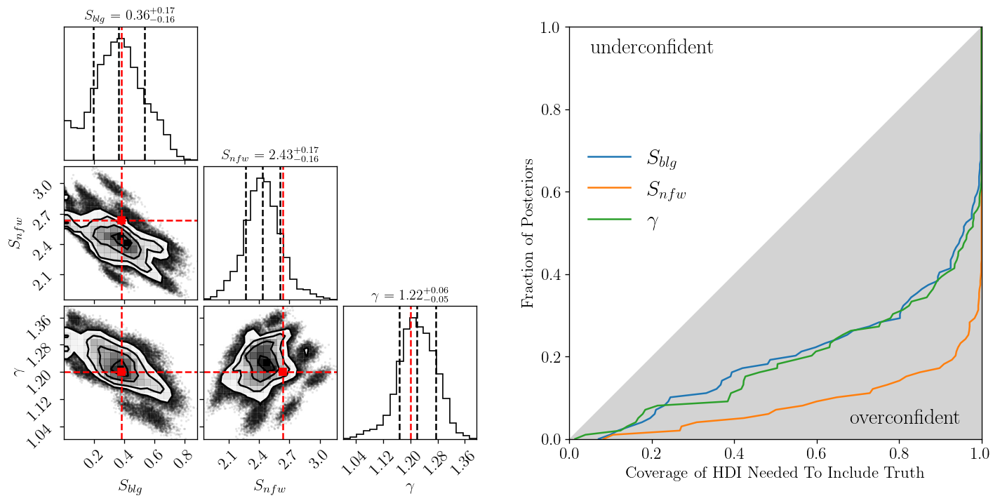

In [83]:
corner_samples = {k : temp_samples_tot_list_r[:,i] for i,k in enumerate(keys)}
temp_dict = {k : p_tr[i] for i,k in enumerate(keys)}

fig = plt.figure(figsize=(12,6), dpi= 120)
subfigs = fig.subfigures(1, 2, wspace=0)

labels = ef.gen_labels(list(corner_samples.keys()))
ef.make_corner_plots(corner_samples, with_mean_vlines = False, sim_vlines = True, temp_dict = temp_dict, labels = labels, fig = subfigs[0])

ax = plt.subplot2grid((1, 1), (0, 0), fig = subfigs[1])

view_keys = keys
linestyles = ['-', '--', ':', '-.']

ax.fill_between([0,1], [0,1], color='lightgray')
for i, (k, roc) in enumerate(roc_runs.items()):
    if k in view_keys:
        label = ef.gen_labels([k])[0]
        ax.plot(roc, np.linspace(0, 1, n_actual_run), label=label, color=f'C{i%10}', linestyle=linestyles[i//10])

ax.set(aspect=1)
ax.set(xlabel='Coverage of HDI Needed To Include Truth', ylabel='Fraction of Posteriors')
ax.set(xlim = (0,1), ylim = (0,1))
ax.text(0.95, 0.05, 'overconfident', ha='right', va='center')
ax.text(0.05, 0.95, 'underconfident', ha='left', va='center')
ax.legend(bbox_to_anchor=(0, 0.75), loc='upper left', bbox_transform=ax.transAxes, frameon=False,)

fig.savefig('appendix_figures/fig_poiss_summary_gp.pdf', bbox_inches='tight')

## Figure 10
`src: /data/edr76/gce-gp/kernel_choice/kernel_comparisons.ipynb`

In [84]:
# load data
mask_map_cart, gp_true, exp_gp_samples_cart_list = pickle.load(open('data/app_kernels.p', 'rb'))

Slice at y = 3.37500 deg
Slice at y = 3.37500 deg
Slice at y = 3.37500 deg
Slice at y = 3.37500 deg


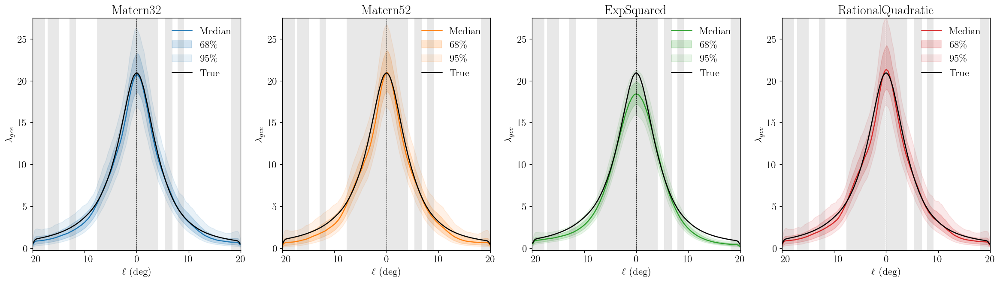

In [85]:
slice_val = 3.2  # y-value of slice
sim_cart = ef.healpix_to_cart(gp_true, mask, n_pixels = n_pixels, nside = 128) # simulated rate cartesian map
raw_cart = None

fig, axes = plt.subplots(figsize=(6*4, 6 - 0.125), dpi= 120, nrows = 1, ncols = 4)

titles = ['Matern32', 'Matern52', 'ExpSquared', 'RationalQuadratic']

q_list = [np.percentile(exp_gp_samples_cart, [2.5,16,50,84,97.5], axis = 0) for exp_gp_samples_cart in exp_gp_samples_cart_list]
for i, q in enumerate(q_list):
    plt.axes(axes[i])
    eplt.cart_plot_1d(q, sim_cart = sim_cart, raw_cart = raw_cart, 
        slice_val = slice_val, 
        mask_map_cart = mask_map_cart,
        n_pixels = n_pixels,
        ylabel = '$\\lambda_{gce}$', q_color = 'C' + str(i), line_color = 'black')
    axes[i].set_title(titles[i])
    axes[i].set_ylim(-0.25, 27.5)
fig.savefig('appendix_figures/fig_kernels.pdf', bbox_inches='tight')

## Figure 11
`src: Amarel/scratch/vary_templates_mask/summary_plots_nu.ipynb`

In [86]:
# load data
Nu_list, q_list, ordered_names = pickle.load(open('data/app_nu_scan.p', 'rb'))

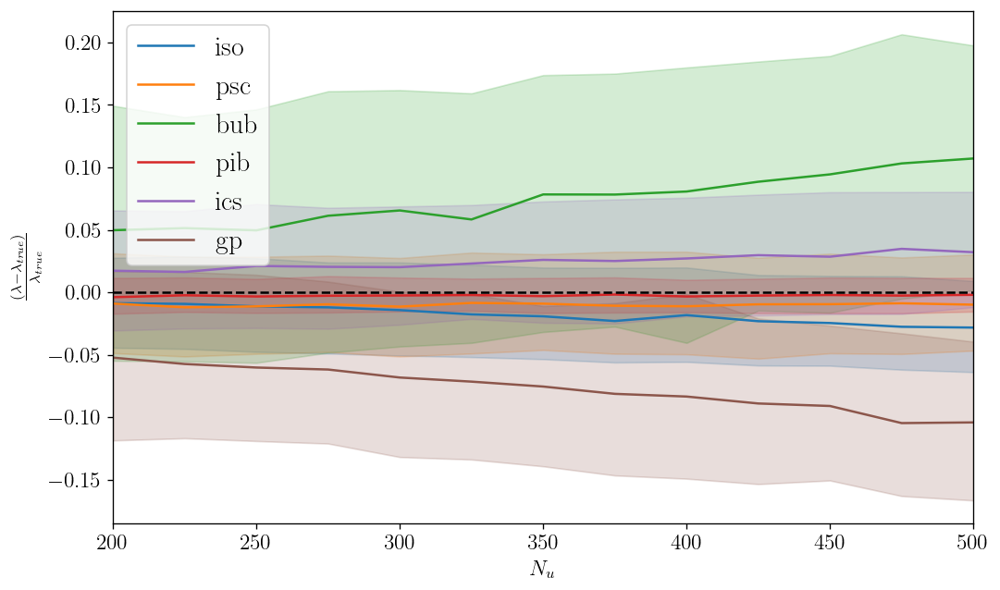

In [87]:
fig = plt.figure(figsize=(10,6), dpi= 120)
eplt.scan_plot(Nu_list, q_list, '$N_{u}$', ordered_names, all_temp_names, ccodes)
fig.savefig('appendix_figures/fig_nu_scan.pdf', bbox_inches='tight')

## Figure 12
`src: Amarel/scratch/vary_templates_mask/gamma_scan (bulge_scan)`

In [88]:
# load data
syn_gamma_list, q_gamma_list, ordered_names = pickle.load(open('data/app_gamma_scan.p', 'rb'))
syn_blg_id_list, q_blg_list, ordered_names = pickle.load(open('data/app_blg_scan.p', 'rb'))

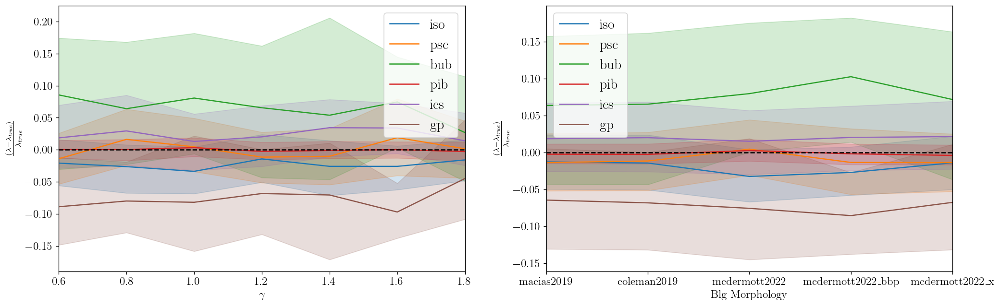

In [89]:
fig, axes = plt.subplots(figsize=(20,6), dpi= 120, nrows = 1, ncols = 2)

plt.axes(axes[0])
eplt.scan_plot(syn_gamma_list, q_gamma_list, '$\\gamma$', ordered_names, all_temp_names, ccodes)

plt.axes(axes[1])
eplt.scan_plot(syn_blg_id_list, q_blg_list, 'Blg Morphology', ordered_names, all_temp_names, ccodes)
blg_names = [ef.gen_blg_name_(syn_blg_id_list[i])[0] for i in range(len(syn_blg_id_list))]
axes[1].set_xticks(syn_blg_id_list)
axes[1].set_xticklabels(blg_names, rotation = 0)

fig.savefig('appendix_figures/fig_gce_scan.pdf', bbox_inches='tight')

## Figure 13
`src: /data/edr76/gce-gp/zero_gce/0c-gp_fit_to_sim.ipynb`

In [90]:
# load data
temp_dict, temp_sample_dict, temp_sample_dict_cmask, exp_gp_samples_cart, gp_true, sim_cart, mask_map_cart = pickle.load(open('data/app_zero_gp.p', 'rb'))

Slice at y = 3.37500 deg
Slice at x = 3.37500 deg


/data/edr76/gce-gp/figures/../utils/ed_fcts_amarel.py:665: RuntimeWarning: divide by zero encountered in log10
  hp_map = hp.ma(np.log10(full_array))
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:407: UserWarning: 
 *** Overriding default plot properies: {'cbar_shrink': 0.6, 'cbar_pad': 0.05, 'cbar_label_pad': -8, 'cbar_tick_direction': 'out', 'vertical_tick_rotation': 90, 'figure_width': 8.5, 'figure_size_ratio': 0.63} ***
  warnings.warn(
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:411: UserWarning: 
 *** New plot properies: {'cbar_shrink': 0.6, 'cbar_pad': 0.1, 'cbar_label_pad': -8, 'cbar_tick_direction': 'out', 'vertical_tick_rotation': 90, 'figure_width': 8.5, 'figure_size_ratio': 0.63} ***
  warnings.warn("\n *** New plot properies: " + str(plot_properties) + " ***")
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:621: UserWarning: FixedFormatter should only be used together with Fi

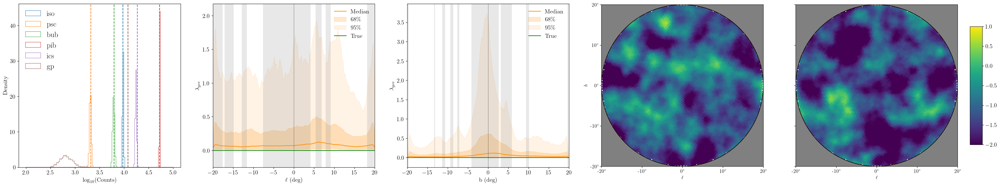

In [91]:
slice_val = 3.2  # y-value of slice

n_subplots = 5 
vmin = -2. ; vmax = 1.

# gridspec = {'width_ratios': [1, 1, 1, 1, 1, 0.1]}
fig, axes = plt.subplots(figsize=(8.15*n_subplots, 6), dpi= 120, nrows = 1, ncols = n_subplots)

plt.axes(axes[0])
ef.tot_log_counts_hist(temp_sample_dict, temp_dict, temp_names_sim, mask = mask_p, bins = np.linspace(2.,5.,150), gp_model_nfw=True, gp_model_iso = False, ax = axes[0])

# 1d slice of GCE
q = np.percentile(exp_gp_samples_cart, [2.5,16,50,84,97.5], axis = 0) # cartesian sample map quantiles
raw_cart = None

plt.axes(axes[1], aspect = 'equal')
eplt.cart_plot_1d(q, sim_cart = sim_cart, raw_cart = raw_cart, 
    slice_dir = 'horizontal', slice_val = slice_val, 
    mask_map_cart = mask_map_cart,
    n_pixels = n_pixels,
    ylabel = '$\lambda_{gce}$', q_color = 'darkorange', line_color = 'green')

plt.axes(axes[2], aspect = 'equal')
eplt.cart_plot_1d(q, sim_cart = sim_cart, raw_cart = raw_cart, 
    slice_dir = 'vertical', slice_val = slice_val, 
    mask_map_cart = mask_map_cart,
    n_pixels = n_pixels,
    ylabel = '$\lambda_{gce}$', q_color = 'darkorange', line_color = 'green')

for n in range(3, n_subplots):
    m = ef.convert_masked_array_to_hp_array(temp_sample_dict_cmask['gp'][n], mask, log_option = True, nside = 128)
    ax = axes[n]
    plt.axes(ax)
    eplt.inner_roi_map(m, title = None, vmin = vmin, vmax = vmax, subplot = int('1' + str(n_subplots) + str(n + 1)), 
        display_y_info = False if n != 3 else True,
        cbar = False, 
        xsize = xsize)
    
# setup the normalization and the colormap
normalize = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
colormap = mpl.cm.viridis

# setup the colorbar
scalarmappaple = mpl.cm.ScalarMappable(norm=normalize, cmap=colormap)
scalarmappaple.set_array(np.linspace(vmin,vmax,100))
fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.81, 0.175, 0.01, 0.65])  # left, bottom, width, height
# plt.tight_layout(pad = -2)
fig.colorbar(scalarmappaple, cax=cbar_ax)
fig.savefig('appendix_figures/fig_zero_gp.pdf', bbox_inches='tight')

## Figure 14
`src: amarel/vary_templates_mask/poisson_corner_plots.ipynb`

In [92]:
# load data
temp_dict, corner_samples_list = pickle.load(open('data/app_mask_res.p', 'rb'))

  0%|          | 0/4 [00:00<?, ?it/s]

100%|██████████| 4/4 [00:02<00:00,  1.98it/s]


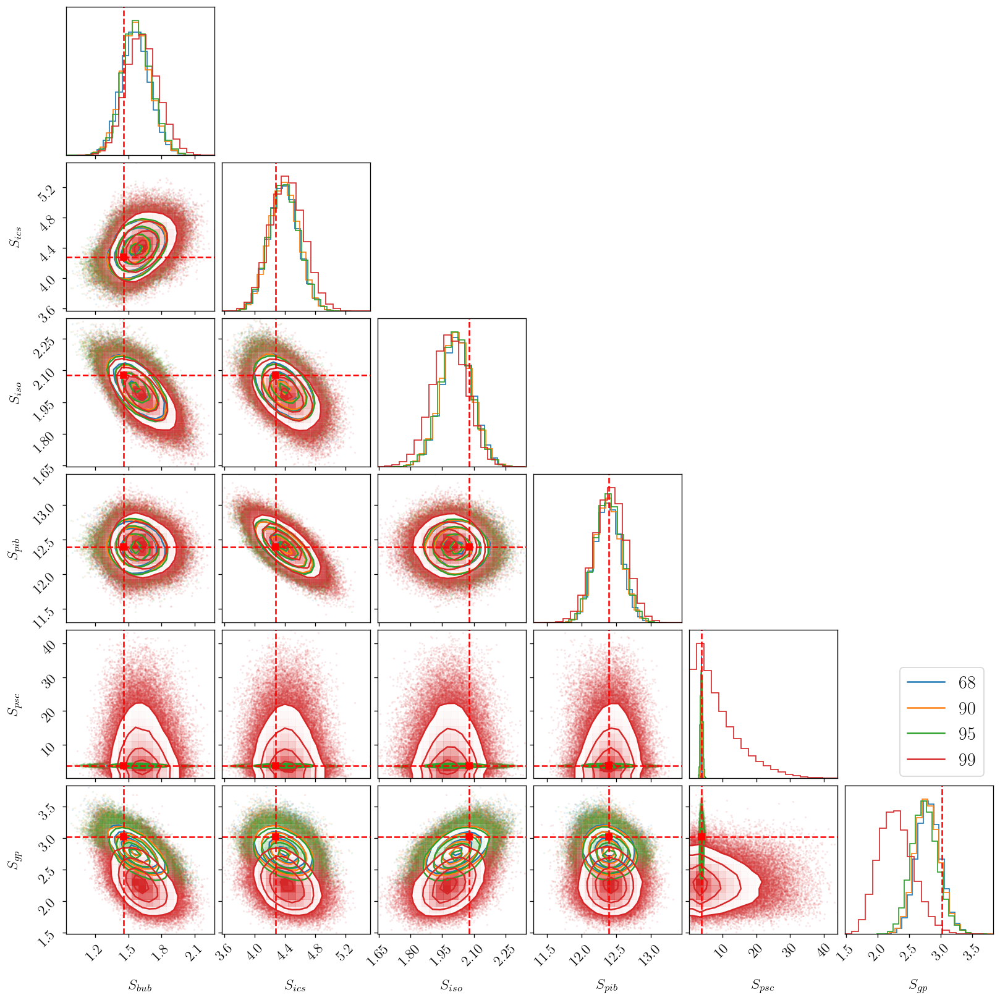

In [93]:
mask_fractions = ['68', '90', '95', '99']

for n in tqdm(range(len(mask_fractions))):
    m = mask_fractions[n]
    corner_samples = corner_samples_list[n]
    names = list(corner_samples.keys())
    
    template_sample_array = np.zeros((len(names), len(corner_samples['S_gp'])))
    for i in range(len(names)):
        name = names[i]
        template_sample_array[i] = corner_samples[name]
    
    color = 'C' + str(n)
    labels = ef.gen_labels(names)
    if n == 0:
        fig = corner.corner(template_sample_array.T, labels=labels, show_titles=False, density = True, 
                        color = color)
    else:
        corner.corner(template_sample_array.T, labels=labels, show_titles=False, fig=fig, density = True, 
                      color = color)
    corner_samples_list.append(corner_samples)

N_var = len(names)
axes = np.array(fig.axes).reshape((N_var, N_var))

for i in range(len(names)):
    name = names[i]
    ax = axes[i,i]
    if name == 'S_gp':
        ax.axvline(temp_dict['S_nfw'] + temp_dict['S_blg'], color='red', linestyle='--')
    if name not in list(temp_dict.keys()):
        continue
    else:
        ax.axvline(temp_dict[name], color='red', linestyle='--')

for yi in range(len(names)):
    for xi in range(yi):
        ax = axes[yi,xi]
        name_x = names[xi]
        name_y = names[yi]
        if (name_x == 'S_gp') & (name_y != 'S_gp'):
            value_x = temp_dict['S_nfw'] + temp_dict['S_blg']
            value_y = temp_dict[name_y]
        elif (name_x != 'S_gp') & (name_y == 'S_gp'):
            value_x = temp_dict[name_x]
            value_y = temp_dict['S_nfw'] + temp_dict['S_blg']
        elif name_x not in list(temp_dict.keys()):
            continue
        elif name_y not in list(temp_dict.keys()):
            continue
        else:
            value_x = temp_dict[name_x]
            value_y = temp_dict[name_y]

        ax.axvline(value_x, color='red', linestyle='--')
        ax.axhline(value_y, color='red', linestyle='--')
        ax.plot(value_x, value_y, "sr")
        
lines = [mpl.lines.Line2D([], [], color='C' + str(n), label=mask_fractions[n] + '%') for n in range(len(mask_fractions))]
plt.legend(handles=lines, bbox_to_anchor=(0., 1.0, 1., .0), loc=4)

fig.savefig('appendix_figures/fig_mask_res.pdf', bbox_inches='tight')

# Figures 15 - 20
`src: /data/edr76/gce-gp/diffuse_model_tests/single_plots_fin.ipynb`

In [94]:
# load data (~7 GB ; ~6.5 min)
seq = pickle.load(open('../diffuse_model_tests/plotting_data/multi/all_mismodelling_data.p', 'rb'))
temp_sample_dict_list, temp_sample_dict_cmask_list, exp_gp_samples_cart_list, gp_true_cart_list, tot_samples_cart_list, model_residuals_cart_list, mask, mask_p, mask_map_cart = seq

# load synthetic data
temp_dict_list, sim_cart_list = pickle.load(open('../diffuse_model_tests/plotting_data/multi/temp_dict_list.p', 'rb'))

# cartesian map of masks to keep track of masking for plots
mask_map = np.zeros((~mask_p).sum())
mask_map_cart = ef.healpix_to_cart(mask_map, mask_p, n_pixels = n_pixels, nside = 128, nan_fill = True) # doesn't matter what mask used

## Figure 15 

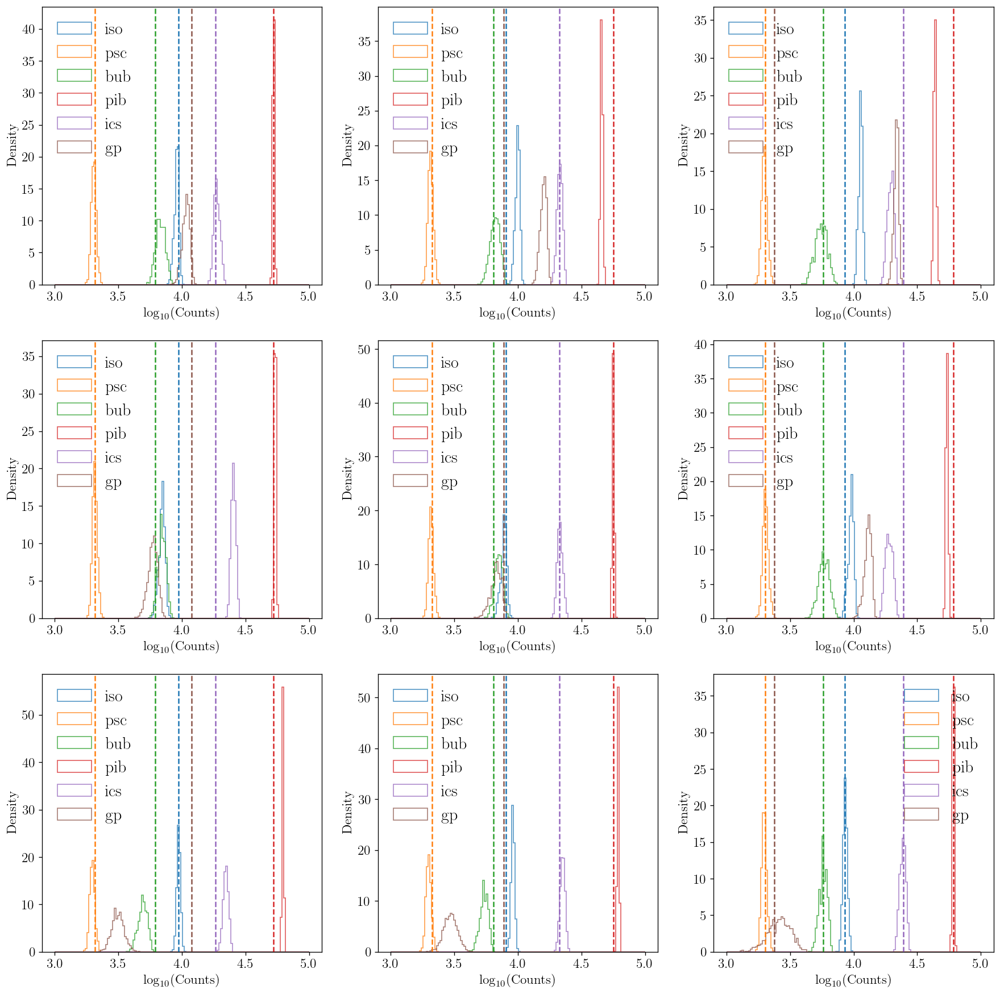

In [95]:
# plot total counts histogram for each fit
# row: different diffuse model ; column: different synthetic dataset

nrows = 3 ; ncols = 3
fig, axes = plt.subplots(figsize=(6*3, 6*3), dpi= 120, nrows = nrows, ncols = ncols)

for i in range(nrows):
    for j in range(ncols):
        mod_id = 10 * (i + 1) + (j + 1)
        temp_sample_dict = temp_sample_dict_list[mod_id]
        temp_dict = temp_dict_list[mod_id]

        plt.axes(axes[i,j])
        ef.tot_log_counts_hist(temp_sample_dict, temp_dict, temp_names_sim, mask = mask_p, bins = np.linspace(3.,5.,150), gp_model_nfw=True, gp_model_iso = False, ax = axes[i,j])

fig.savefig('appendix_figures/fig_dif_norms_1.svg', bbox_inches='tight')

## Figure 16

Slice at y = 3.37500 deg
Slice at y = 3.37500 deg
Slice at y = 3.37500 deg
Slice at y = 3.37500 deg
Slice at y = 3.37500 deg
Slice at y = 3.37500 deg
Slice at y = 3.37500 deg
Slice at y = 3.37500 deg
Slice at y = 3.37500 deg


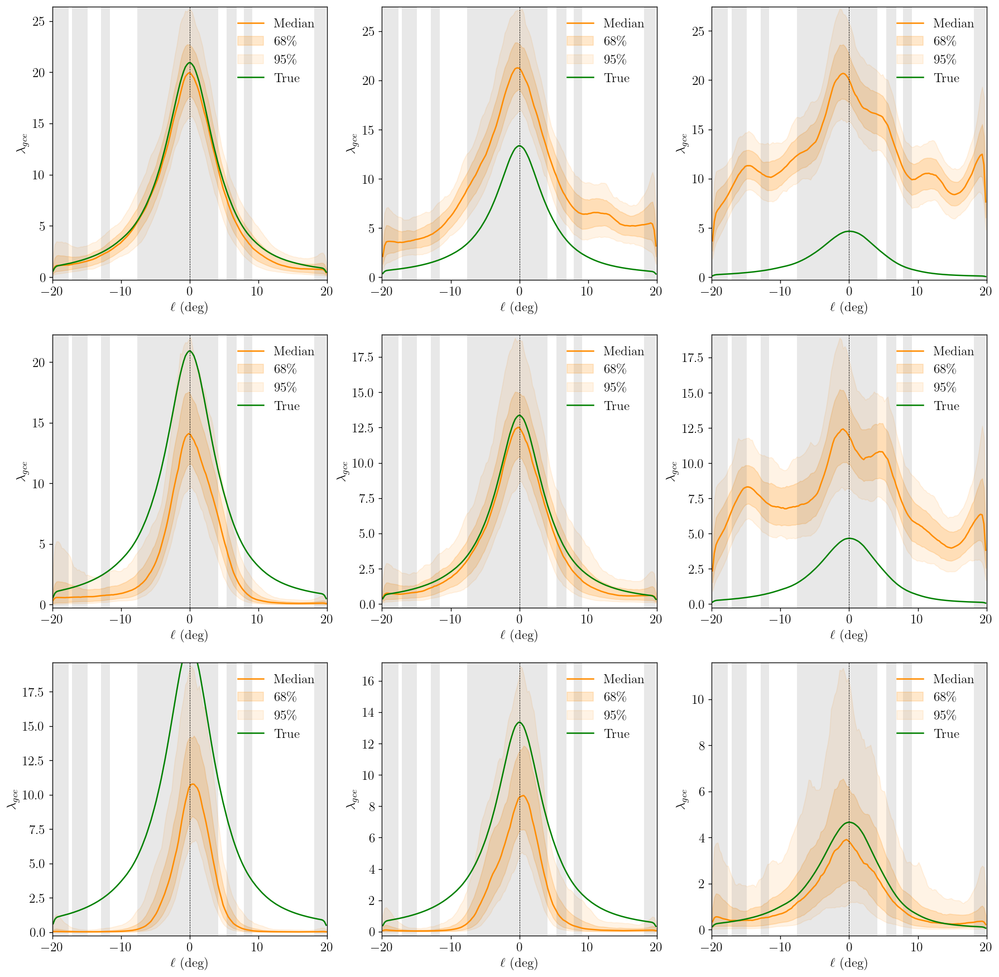

In [96]:
slice_val = 3.2  # y-value of slice

nrows = 3 ; ncols = 3
fig, axes = plt.subplots(figsize=(6*3, 6*3), dpi= 120, nrows = nrows, ncols = ncols)

for i in range(nrows):
    for j in range(ncols):
        mod_id = 10 * (i + 1) + (j + 1)

        exp_gp_samples_cart = exp_gp_samples_cart_list[mod_id]
        gp_true = gp_true_cart_list[mod_id][:5938] # contains 10 copies due to carelessness when creating this

        # 1d slice of GCE
        q = np.percentile(exp_gp_samples_cart, [2.5,16,50,84,97.5], axis = 0) # cartesian sample map quantiles
        sim_cart = ef.healpix_to_cart(gp_true[:5938], mask, n_pixels = n_pixels, nside = 128) # simulated rate cartesian map
        raw_cart = None

        plt.axes(axes[i,j])
        eplt.cart_plot_1d(q, sim_cart = sim_cart, raw_cart = raw_cart, 
            slice_dir = 'horizontal', slice_val = slice_val, 
            mask_map_cart = mask_map_cart,
            n_pixels = n_pixels,
            ylabel = '$\lambda_{gce}$', q_color = 'darkorange', line_color = 'green')

fig.savefig('appendix_figures/fig_dif_hgp_1.svg', bbox_inches='tight')

## Figure 17

Slice at x = 3.37500 deg
Slice at x = 3.37500 deg
Slice at x = 3.37500 deg
Slice at x = 3.37500 deg
Slice at x = 3.37500 deg
Slice at x = 3.37500 deg
Slice at x = 3.37500 deg
Slice at x = 3.37500 deg
Slice at x = 3.37500 deg


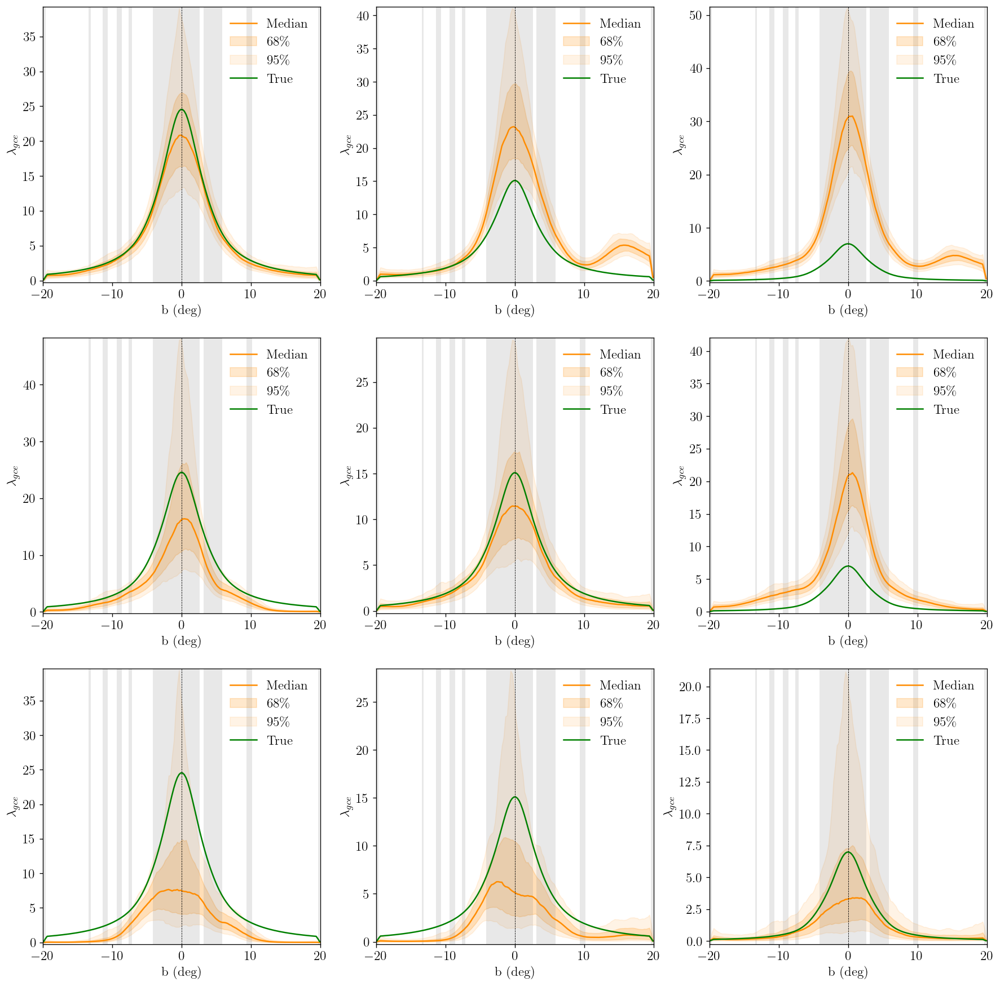

In [97]:
slice_val = 3.2  # y-value of slice

nrows = 3 ; ncols = 3
fig, axes = plt.subplots(figsize=(6*3, 6*3), dpi= 120, nrows = nrows, ncols = ncols)

for i in range(nrows):
    for j in range(ncols):
        mod_id = 10 * (i + 1) + (j + 1)

        exp_gp_samples_cart = exp_gp_samples_cart_list[mod_id]
        gp_true = gp_true_cart_list[mod_id][:5938] # contains 10 copies due to carelessness when creating this

        # 1d slice of GCE
        q = np.percentile(exp_gp_samples_cart, [2.5,16,50,84,97.5], axis = 0) # cartesian sample map quantiles
        sim_cart = ef.healpix_to_cart(gp_true[:5938], mask, n_pixels = n_pixels, nside = 128) # simulated rate cartesian map
        raw_cart = None

        plt.axes(axes[i,j])
        eplt.cart_plot_1d(q, sim_cart = sim_cart, raw_cart = raw_cart, 
            slice_dir = 'vertical', slice_val = slice_val, 
            mask_map_cart = mask_map_cart,
            n_pixels = n_pixels,
            ylabel = '$\lambda_{gce}$', q_color = 'darkorange', line_color = 'green')

fig.savefig('appendix_figures/fig_dif_vgp_1.svg', bbox_inches='tight')

## Figure 18

/data/edr76/gce-gp/figures/../utils/ed_fcts_amarel.py:665: RuntimeWarning: divide by zero encountered in log10
  hp_map = hp.ma(np.log10(full_array))
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:407: UserWarning: 
 *** Overriding default plot properies: {'cbar_shrink': 0.6, 'cbar_pad': 0.05, 'cbar_label_pad': -8, 'cbar_tick_direction': 'out', 'vertical_tick_rotation': 90, 'figure_width': 8.5, 'figure_size_ratio': 0.63} ***
  warnings.warn(
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:411: UserWarning: 
 *** New plot properies: {'cbar_shrink': 0.6, 'cbar_pad': 0.1, 'cbar_label_pad': -8, 'cbar_tick_direction': 'out', 'vertical_tick_rotation': 90, 'figure_width': 8.5, 'figure_size_ratio': 0.63} ***
  warnings.warn("\n *** New plot properies: " + str(plot_properties) + " ***")
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:621: UserWarning: FixedFormatter should only be used together with Fi

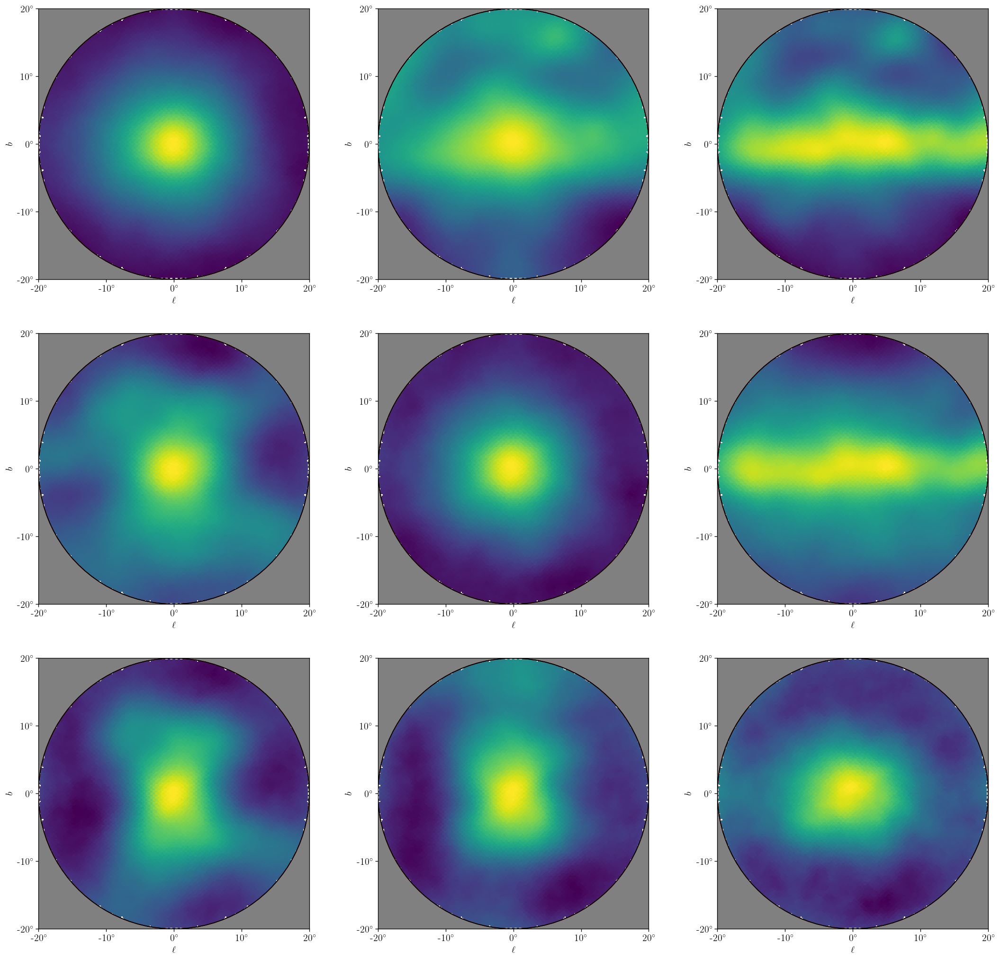

In [98]:
# plot total counts histogram for each fit
# row: different diffuse model ; column: different synthetic dataset

nrows = 3 ; ncols = 3
fig, axes = plt.subplots(figsize=(6*3, 6*3), dpi= 120, nrows = nrows, ncols = ncols)

c = 0
for i in range(nrows):
    for j in range(ncols):
        c += 1

        mod_id = 10 * (i + 1) + (j + 1)
        temp_sample_dict_cmask = temp_sample_dict_cmask_list[mod_id]

        plt.axes(axes[i,j])
        q = np.percentile(temp_sample_dict_cmask['gp'], 50, axis = 0)
        m = ef.convert_masked_array_to_hp_array(q, mask, log_option = True, nside = 128)
        eplt.inner_roi_map(m, title = None, vmin = None, vmax = None, subplot = int(str(nrows) + str(ncols) + str(c)), 
            cbar = False, 
            xsize = xsize)

fig.savefig('appendix_figures/fig_dif_gp_1.svg', bbox_inches='tight')

## Figure 19

Slice at y = 3.37500 deg
Slice at y = 3.37500 deg
Slice at y = 3.37500 deg
Slice at y = 3.37500 deg
Slice at y = 3.37500 deg
Slice at y = 3.37500 deg
Slice at y = 3.37500 deg
Slice at y = 3.37500 deg
Slice at y = 3.37500 deg


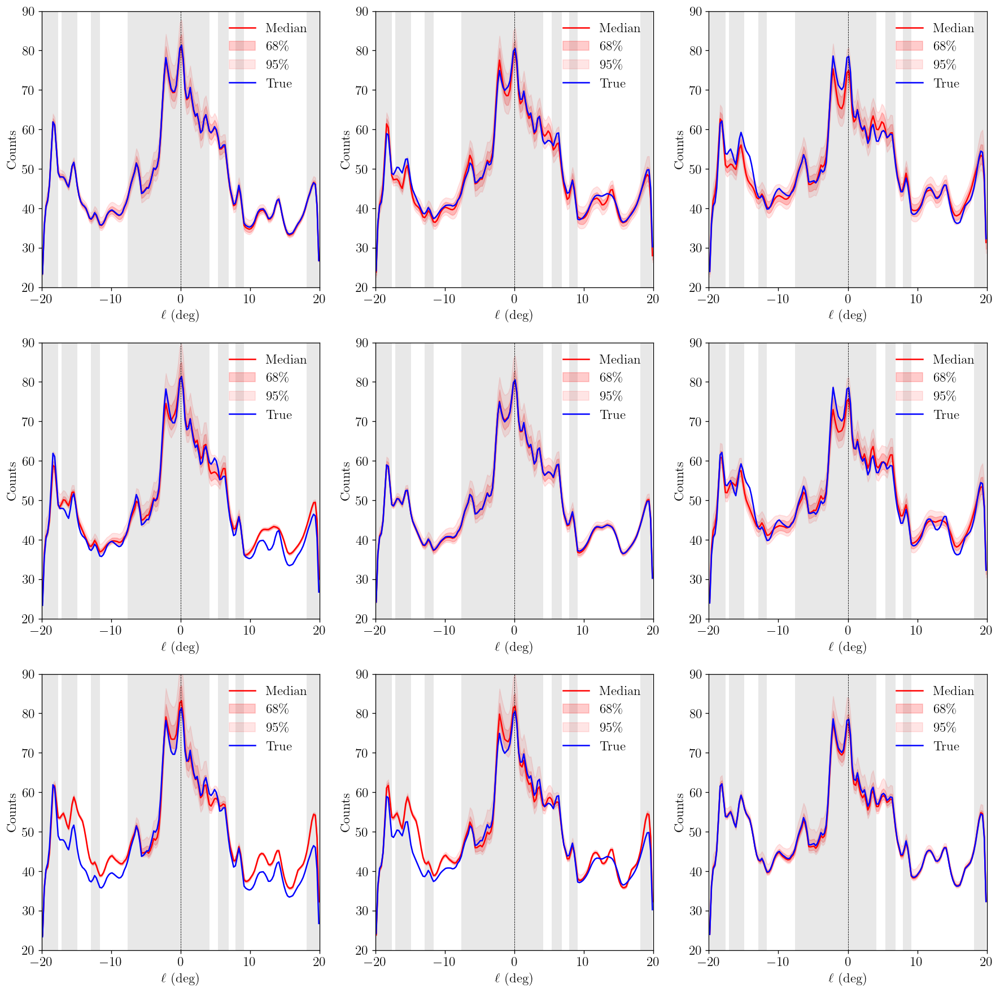

In [99]:
slice_val = 3.2  # y-value of slice

nrows = 3 ; ncols = 3
fig, axes = plt.subplots(figsize=(6*3, 6*3), dpi= 120, nrows = nrows, ncols = ncols)

for i in range(nrows):
    for j in range(ncols):
        mod_id = 10 * (i + 1) + (j + 1)

        tot_samples_cart = tot_samples_cart_list[mod_id]
        sim_cart = sim_cart_list[mod_id]

        # 1d slice of GCE
        q = np.percentile(tot_samples_cart, [2.5,16,50,84,97.5], axis = 0)
        raw_cart = None

        plt.axes(axes[i,j])
        eplt.cart_plot_1d(q, sim_cart = sim_cart, raw_cart = raw_cart, 
            slice_dir = 'horizontal', slice_val = slice_val, 
            ylim = [20., 90.],
            mask_map_cart = mask_map_cart,
            n_pixels = n_pixels,)

fig.savefig('appendix_figures/fig_dif_htot_1.svg', bbox_inches='tight')

## Figure 20

Slice at x = 3.37500 deg
Slice at x = 3.37500 deg
Slice at x = 3.37500 deg
Slice at x = 3.37500 deg
Slice at x = 3.37500 deg
Slice at x = 3.37500 deg
Slice at x = 3.37500 deg
Slice at x = 3.37500 deg
Slice at x = 3.37500 deg


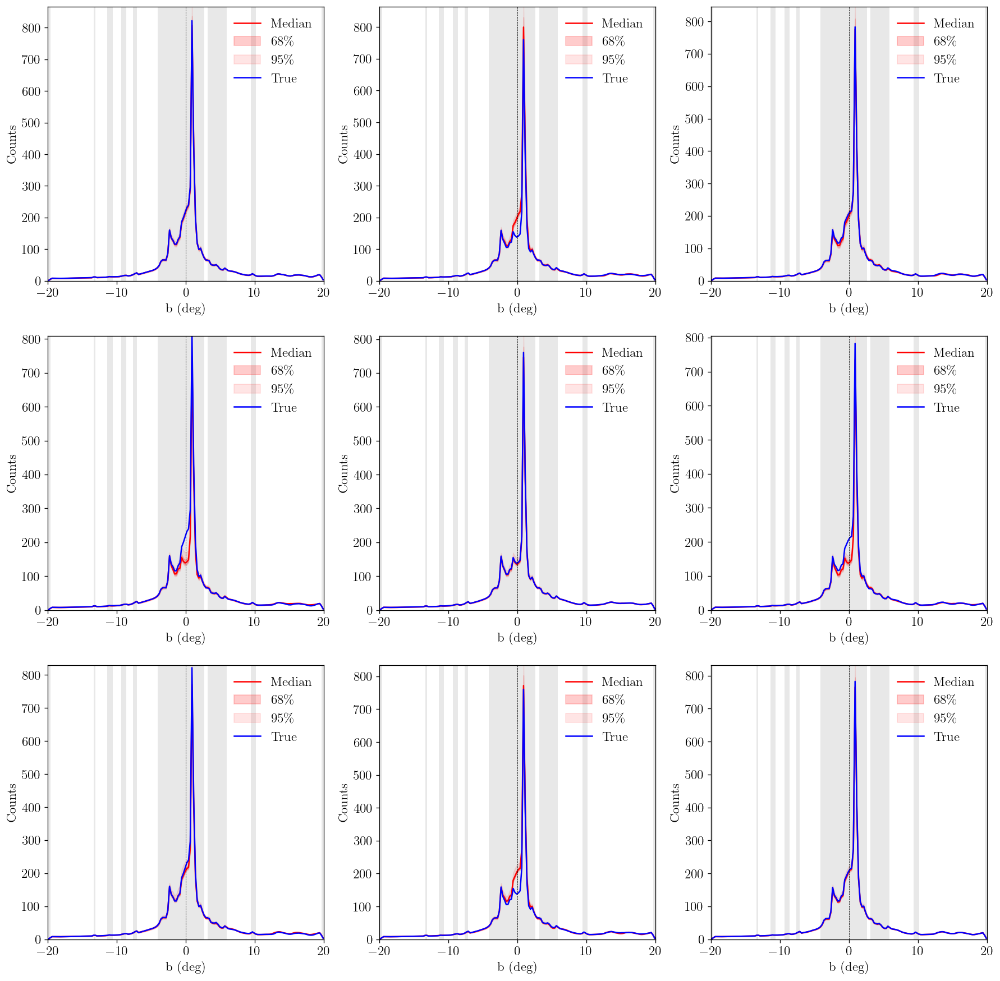

In [100]:
slice_val = 3.2  # y-value of slice

nrows = 3 ; ncols = 3
fig, axes = plt.subplots(figsize=(6*3, 6*3), dpi= 120, nrows = nrows, ncols = ncols)

for i in range(nrows):
    for j in range(ncols):
        mod_id = 10 * (i + 1) + (j + 1)

        tot_samples_cart = tot_samples_cart_list[mod_id]
        sim_cart = sim_cart_list[mod_id]

        # 1d slice of GCE
        q = np.percentile(tot_samples_cart, [2.5,16,50,84,97.5], axis = 0)
        raw_cart = None

        plt.axes(axes[i,j])
        eplt.cart_plot_1d(q, sim_cart = sim_cart, raw_cart = raw_cart, 
            slice_dir = 'vertical', slice_val = slice_val,
            mask_map_cart = mask_map_cart,
            n_pixels = n_pixels,)

fig.savefig('appendix_figures/fig_dif_vtot_1.svg', bbox_inches='tight')

# Figures 21 - 23
`src:  /data/edr76/gce-gp/diffuse_model_tests/multi_plots_2.ipynb`

In [101]:
# load data (~7 GB ; ~6.5 min)
seq = pickle.load(open('../diffuse_model_tests/plotting_data/multi/all_mismodelling_data_2.p', 'rb'))
temp_sample_dict_list, temp_sample_dict_cmask_list, exp_gp_samples_cart_list, gp_true_cart_list, tot_samples_cart_list, model_residuals_cart_list, mask, mask_p, mask_map_cart = seq

# load real data
corner_samples_dict = pickle.load(open('../diffuse_model_tests/plotting_data/multi/corner_samples_dict_2.p', 'rb'))
temp_dict_list, sim_cart_list = pickle.load(open('../diffuse_model_tests/plotting_data/multi/temp_dict_list_2.p', 'rb'))

# correction to temp_sample_dict described in src
temp_sample_dict_list, temp_sample_dict_cmask_list = pickle.load(open('../diffuse_model_tests/plotting_data/multi/temp_dicts_theta_2.p', 'rb'))

## Figure 21

/tmp/ipykernel_213325/1037422786.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  axes_0 = [plt.subplot2grid((4, 3), (0, i), rowspan = 2, colspan = 1) for i in range(ncols)]
/tmp/ipykernel_213325/1037422786.py:11: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  axes_1 = [plt.subplot2grid((4, 3), (2, i), rowspan = 1, colspan = 1) for i in range(ncols)]


231 ['a', 'f']
132 ['o', 'f']
123 ['o', 'a']


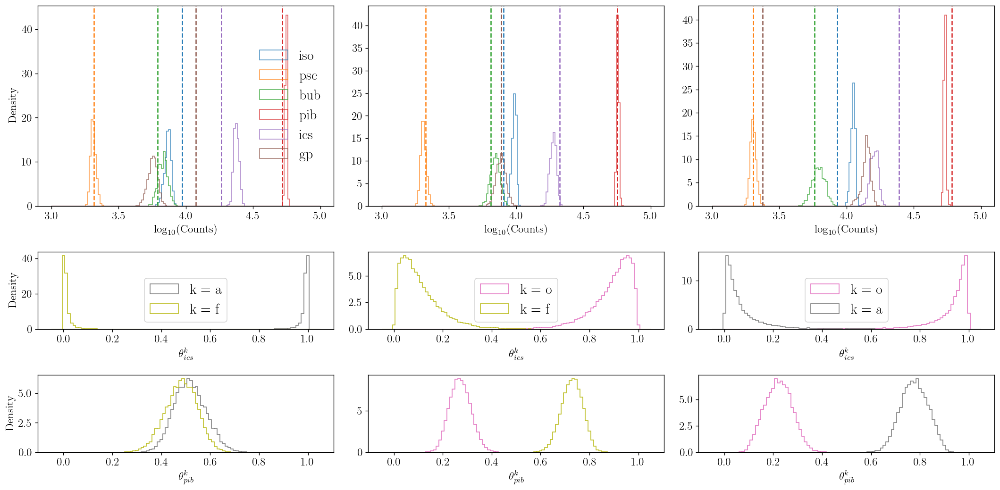

In [102]:
# plot total counts histogram for each fit
# row: different diffuse model ; column: different synthetic dataset

mod_ids = list(temp_dict_list.keys())
data_models = ['o', 'a', 'f']

nrows = 3 ; ncols = 3
fig, axes = plt.subplots(figsize=(6*3, 9), dpi= 120, nrows = 3, ncols = ncols)

axes_0 = [plt.subplot2grid((4, 3), (0, i), rowspan = 2, colspan = 1) for i in range(ncols)]
axes_1 = [plt.subplot2grid((4, 3), (2, i), rowspan = 1, colspan = 1) for i in range(ncols)]
axes_2 = [plt.subplot2grid((4, 3), (3, i), rowspan = 1, colspan = 1) for i in range(ncols)]
axes = [axes_0, axes_1, axes_2]

for i in range(ncols):
    mod_id = mod_ids[i]
    temp_sample_dict = temp_sample_dict_list[mod_id]
    corner_samples = corner_samples_dict[mod_id]
    temp_dict = temp_dict_list[mod_id]

    plt.axes(axes[0][i])

    ef.tot_log_counts_hist(temp_sample_dict, temp_dict, temp_names_sim, mask = mask_p, bins = np.linspace(3.,5.,150), gp_model_nfw=True, gp_model_iso = False, ax = axes[0][i], 
                        display_y_info = True if i == 0 else False, legend = True if i == 0 else False)

    data_mods_idx = [int(str(mod_id)[i]) - 1 for i in range(2)]
    data_mods = [data_models[int(str(mod_id)[i]) - 1] for i in range(2)]
    print(mod_id, data_mods)
    for k in range(len(data_mods)):
        color = 'C{}'.format(data_mods_idx[k] + 6)
        plt.axes(axes[1][i])
        plt.hist(corner_samples['theta_ics'][:,k], bins = np.linspace(-0.05,1.05,100), histtype='step', color = color, label = 'k = {}'.format(data_mods[k]), density = True)
        plt.xlabel('$\\theta_{ics}^{k}$')
        plt.ylabel('Density') if i == 0 else None
        plt.legend() 

        plt.axes(axes[2][i])
        plt.hist(corner_samples['theta_pib'][:,k], bins = np.linspace(-0.05,1.05,100), histtype='step', color = color, label = 'k = {}'.format(data_mods[k]), density = True)
        plt.xlabel('$\\theta_{pib}^{k}$')
        plt.ylabel('Density') if i == 0 else None

plt.tight_layout()
fig.savefig('appendix_figures/fig_dif_norms_2.svg', bbox_inches='tight')

## Figure 22

Slice at y = 3.37500 deg
Slice at x = 3.37500 deg


/data/edr76/gce-gp/figures/../utils/ed_fcts_amarel.py:665: RuntimeWarning: divide by zero encountered in log10
  hp_map = hp.ma(np.log10(full_array))
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:407: UserWarning: 
 *** Overriding default plot properies: {'cbar_shrink': 0.6, 'cbar_pad': 0.05, 'cbar_label_pad': -8, 'cbar_tick_direction': 'out', 'vertical_tick_rotation': 90, 'figure_width': 8.5, 'figure_size_ratio': 0.63} ***
  warnings.warn(
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:411: UserWarning: 
 *** New plot properies: {'cbar_shrink': 0.6, 'cbar_pad': 0.1, 'cbar_label_pad': -8, 'cbar_tick_direction': 'out', 'vertical_tick_rotation': 90, 'figure_width': 8.5, 'figure_size_ratio': 0.63} ***
  warnings.warn("\n *** New plot properies: " + str(plot_properties) + " ***")
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:621: UserWarning: FixedFormatter should only be used together with Fi

Slice at y = 3.37500 deg
Slice at x = 3.37500 deg


/data/edr76/gce-gp/figures/../utils/ed_fcts_amarel.py:665: RuntimeWarning: divide by zero encountered in log10
  hp_map = hp.ma(np.log10(full_array))
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:407: UserWarning: 
 *** Overriding default plot properies: {'cbar_shrink': 0.6, 'cbar_pad': 0.05, 'cbar_label_pad': -8, 'cbar_tick_direction': 'out', 'vertical_tick_rotation': 90, 'figure_width': 8.5, 'figure_size_ratio': 0.63} ***
  warnings.warn(
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:411: UserWarning: 
 *** New plot properies: {'cbar_shrink': 0.6, 'cbar_pad': 0.1, 'cbar_label_pad': -8, 'cbar_tick_direction': 'out', 'vertical_tick_rotation': 90, 'figure_width': 8.5, 'figure_size_ratio': 0.63} ***
  warnings.warn("\n *** New plot properies: " + str(plot_properties) + " ***")
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:621: UserWarning: FixedFormatter should only be used together with Fi

Slice at y = 3.37500 deg
Slice at x = 3.37500 deg


/data/edr76/gce-gp/figures/../utils/ed_fcts_amarel.py:665: RuntimeWarning: divide by zero encountered in log10
  hp_map = hp.ma(np.log10(full_array))
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:407: UserWarning: 
 *** Overriding default plot properies: {'cbar_shrink': 0.6, 'cbar_pad': 0.05, 'cbar_label_pad': -8, 'cbar_tick_direction': 'out', 'vertical_tick_rotation': 90, 'figure_width': 8.5, 'figure_size_ratio': 0.63} ***
  warnings.warn(
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:411: UserWarning: 
 *** New plot properies: {'cbar_shrink': 0.6, 'cbar_pad': 0.1, 'cbar_label_pad': -8, 'cbar_tick_direction': 'out', 'vertical_tick_rotation': 90, 'figure_width': 8.5, 'figure_size_ratio': 0.63} ***
  warnings.warn("\n *** New plot properies: " + str(plot_properties) + " ***")
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:621: UserWarning: FixedFormatter should only be used together with Fi

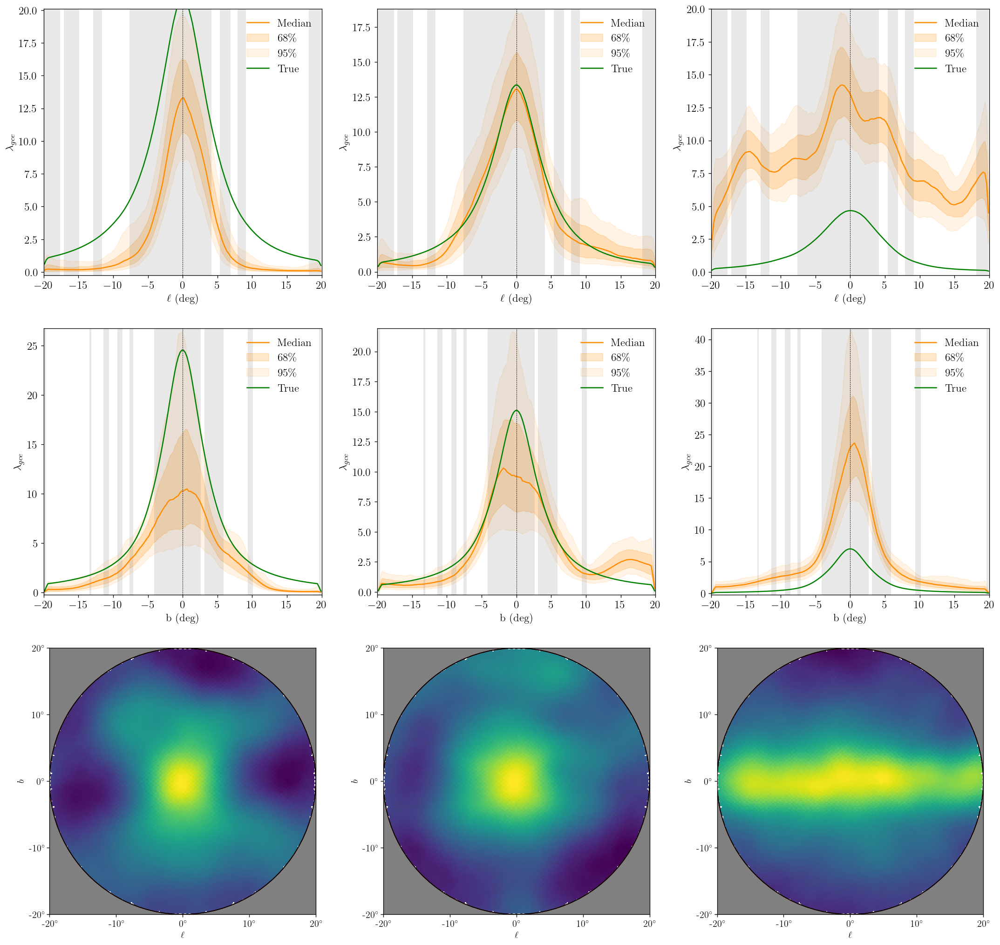

In [103]:
# plot total counts histogram for each fit
# row: different diffuse model ; column: different synthetic dataset

slice_val = 3.2  # y-value of slice

nrows = 3 ; ncols = 3
fig, axes = plt.subplots(figsize=(6*3, 6*3), dpi= 120, nrows = nrows, ncols = ncols)

c = 6
for i in range(ncols):
    mod_id = mod_ids[i]

    exp_gp_samples_cart = exp_gp_samples_cart_list[mod_id]
    gp_true = gp_true_cart_list[mod_id][:5938] # contains 10 copies due to carelessness when creating this

    # 1d slice of GCE
    q = np.percentile(exp_gp_samples_cart, [2.5,16,50,84,97.5], axis = 0) # cartesian sample map quantiles
    sim_cart = ef.healpix_to_cart(gp_true[:5938], mask, n_pixels = n_pixels, nside = 128) # simulated rate cartesian map
    raw_cart = None

    plt.axes(axes[0,i])
    eplt.cart_plot_1d(q, sim_cart = sim_cart, raw_cart = raw_cart, 
        slice_dir = 'horizontal', slice_val = slice_val, 
        mask_map_cart = mask_map_cart,
        n_pixels = n_pixels,
        ylabel = '$\lambda_{gce}$', q_color = 'darkorange', line_color = 'green')

    # 1d slice of GCE
    q = np.percentile(exp_gp_samples_cart, [2.5,16,50,84,97.5], axis = 0) # cartesian sample map quantiles
    sim_cart = ef.healpix_to_cart(gp_true[:5938], mask, n_pixels = n_pixels, nside = 128) # simulated rate cartesian map
    raw_cart = None

    plt.axes(axes[1,i])
    eplt.cart_plot_1d(q, sim_cart = sim_cart, raw_cart = raw_cart, 
        slice_dir = 'vertical', slice_val = slice_val, 
        mask_map_cart = mask_map_cart,
        n_pixels = n_pixels,
        ylabel = '$\lambda_{gce}$', q_color = 'darkorange', line_color = 'green')

    c += 1
    temp_sample_dict_cmask = temp_sample_dict_cmask_list[mod_id]

    plt.axes(axes[2,i])
    q = np.percentile(temp_sample_dict_cmask['gp'], 50, axis = 0)
    m = ef.convert_masked_array_to_hp_array(q, mask, log_option = True, nside = 128)
    eplt.inner_roi_map(m, title = None, vmin = None, vmax = None, subplot = int(str(nrows) + str(ncols) + str(c)), 
        cbar = False, 
        xsize = xsize)

fig.savefig('appendix_figures/fig_dif_gp_2.svg', bbox_inches='tight')

## Figure 23

Slice at y = 3.37500 deg
Slice at x = 3.37500 deg
Slice at y = 3.37500 deg
Slice at x = 3.37500 deg
Slice at y = 3.37500 deg
Slice at x = 3.37500 deg


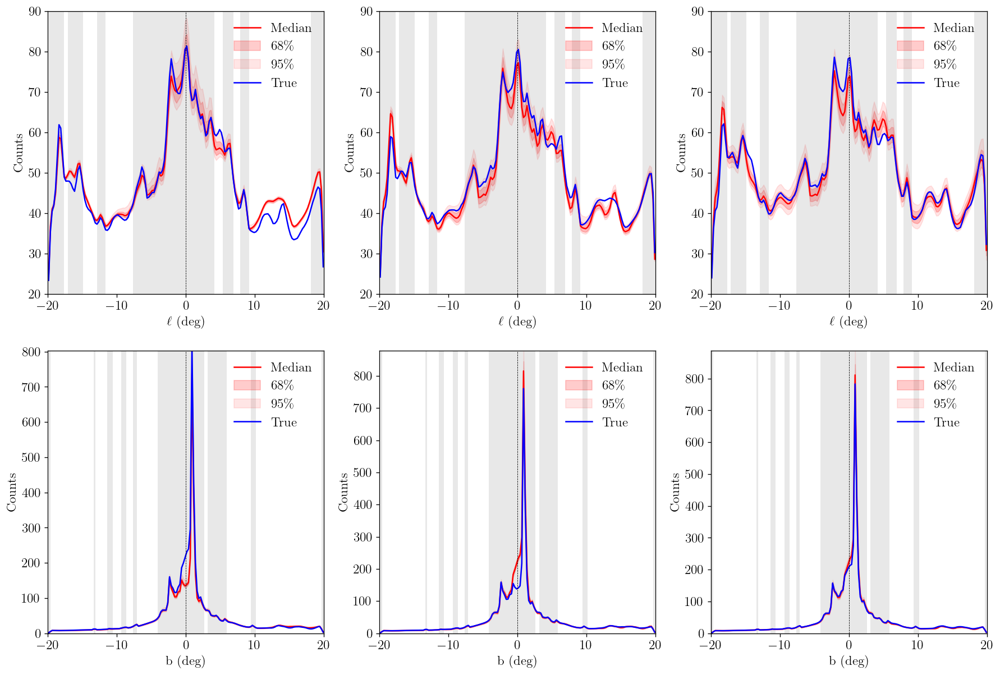

In [104]:
# plot total counts histogram for each fit
# row: different diffuse model ; column: different synthetic dataset

slice_val = 3.2  # y-value of slice

nrows = 2 ; ncols = 3
fig, axes = plt.subplots(figsize=(6*3, 6*2), dpi= 120, nrows = nrows, ncols = ncols)

for i in range(ncols):
    mod_id = mod_ids[i]

    tot_samples_cart = tot_samples_cart_list[mod_id]
    sim_cart = sim_cart_list[mod_id]

    # 1d slice of GCE
    q = np.percentile(tot_samples_cart, [2.5,16,50,84,97.5], axis = 0)
    raw_cart = None

    plt.axes(axes[0,i])
    eplt.cart_plot_1d(q, sim_cart = sim_cart, raw_cart = raw_cart, 
        slice_dir = 'horizontal', slice_val = slice_val, 
        ylim = [20., 90.],
        mask_map_cart = mask_map_cart,
        n_pixels = n_pixels,)

    plt.axes(axes[1,i])
    eplt.cart_plot_1d(q, sim_cart = sim_cart, raw_cart = raw_cart, 
        slice_dir = 'vertical', slice_val = slice_val,
        mask_map_cart = mask_map_cart,
        n_pixels = n_pixels,)

fig.savefig('appendix_figures/fig_dif_tot_2.svg', bbox_inches='tight')

# Figures 24 - 26
`src: /data/edr76/gce-gp/diffuse_model_tests/multi_plots_3.ipynb`

In [105]:
# load data (~7 GB ; ~6.5 min)
seq = pickle.load(open('../diffuse_model_tests/plotting_data/multi/all_mismodelling_data_3.p', 'rb'))
temp_sample_dict_list, temp_sample_dict_cmask_list, exp_gp_samples_cart_list, gp_true_cart_list, tot_samples_cart_list, model_residuals_cart_list, mask, mask_p, mask_map_cart = seq

# load real data
corner_samples_dict = pickle.load(open('../diffuse_model_tests/plotting_data/multi/corner_samples_dict_3.p', 'rb'))
temp_dict_list, sim_cart_list = pickle.load(open('../diffuse_model_tests/plotting_data/multi/temp_dict_list_3.p', 'rb'))

# correction to temp_sample_dict described in src
temp_sample_dict_list, temp_sample_dict_cmask_list = pickle.load(open('../diffuse_model_tests/plotting_data/multi/temp_dicts_theta_3.p', 'rb'))

## Figure 24

/tmp/ipykernel_213325/1856347378.py:10: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  axes_0 = [plt.subplot2grid((4, 3), (0, i), rowspan = 2, colspan = 1) for i in range(ncols)]
/tmp/ipykernel_213325/1856347378.py:11: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  axes_1 = [plt.subplot2grid((4, 3), (2, i), rowspan = 1, colspan = 1) for i in range(ncols)]


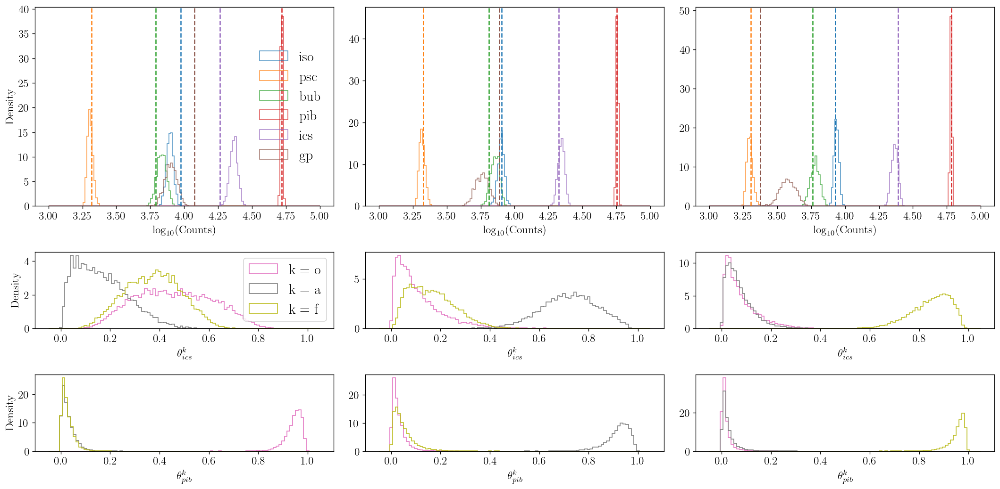

In [106]:
# plot total counts histogram for each fit
# row: different diffuse model ; column: different synthetic dataset

mod_ids = list(temp_dict_list.keys())
data_mods = ['o', 'a', 'f']

nrows = 3 ; ncols = 3
fig, axes = plt.subplots(figsize=(6*3, 9), dpi= 120, nrows = 3, ncols = ncols)

axes_0 = [plt.subplot2grid((4, 3), (0, i), rowspan = 2, colspan = 1) for i in range(ncols)]
axes_1 = [plt.subplot2grid((4, 3), (2, i), rowspan = 1, colspan = 1) for i in range(ncols)]
axes_2 = [plt.subplot2grid((4, 3), (3, i), rowspan = 1, colspan = 1) for i in range(ncols)]
axes = [axes_0, axes_1, axes_2]

for i in range(ncols):
    mod_id = mod_ids[i]
    temp_sample_dict = temp_sample_dict_list[mod_id]
    corner_samples = corner_samples_dict[mod_id]
    temp_dict = temp_dict_list[mod_id]

    plt.axes(axes[0][i])
    ef.tot_log_counts_hist(temp_sample_dict, temp_dict, temp_names_sim, mask = mask_p, bins = np.linspace(3.,5.,150), gp_model_nfw=True, gp_model_iso = False, ax = axes[0][i], 
                        display_y_info = True if i == 0 else False, legend = True if i == 0 else False)

    for k in range(len(data_mods)):
        color = 'C{}'.format(k + 6)
        plt.axes(axes[1][i])
        plt.hist(corner_samples['theta_ics'][:,k], bins = np.linspace(-0.05,1.05,100), histtype='step', color = color, label = 'k = {}'.format(data_mods[k]), density = True)
        plt.xlabel('$\\theta_{ics}^{k}$')
        plt.ylabel('Density') if i == 0 else None
        plt.legend() if i == 0 else None

        plt.axes(axes[2][i])
        plt.hist(corner_samples['theta_pib'][:,k], bins = np.linspace(-0.05,1.05,100), histtype='step', color = color, label = 'k = {}'.format(data_mods[k]), density = True)
        plt.xlabel('$\\theta_{pib}^{k}$')
        plt.ylabel('Density') if i == 0 else None

plt.tight_layout()
fig.savefig('appendix_figures/fig_dif_norms_3.svg', bbox_inches='tight')

## Figure 25

Slice at y = 3.37500 deg
Slice at x = 3.37500 deg


/data/edr76/gce-gp/figures/../utils/ed_fcts_amarel.py:665: RuntimeWarning: divide by zero encountered in log10
  hp_map = hp.ma(np.log10(full_array))
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:407: UserWarning: 
 *** Overriding default plot properies: {'cbar_shrink': 0.6, 'cbar_pad': 0.05, 'cbar_label_pad': -8, 'cbar_tick_direction': 'out', 'vertical_tick_rotation': 90, 'figure_width': 8.5, 'figure_size_ratio': 0.63} ***
  warnings.warn(
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:411: UserWarning: 
 *** New plot properies: {'cbar_shrink': 0.6, 'cbar_pad': 0.1, 'cbar_label_pad': -8, 'cbar_tick_direction': 'out', 'vertical_tick_rotation': 90, 'figure_width': 8.5, 'figure_size_ratio': 0.63} ***
  warnings.warn("\n *** New plot properies: " + str(plot_properties) + " ***")
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:621: UserWarning: FixedFormatter should only be used together with Fi

Slice at y = 3.37500 deg
Slice at x = 3.37500 deg


/data/edr76/gce-gp/figures/../utils/ed_fcts_amarel.py:665: RuntimeWarning: divide by zero encountered in log10
  hp_map = hp.ma(np.log10(full_array))
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:407: UserWarning: 
 *** Overriding default plot properies: {'cbar_shrink': 0.6, 'cbar_pad': 0.05, 'cbar_label_pad': -8, 'cbar_tick_direction': 'out', 'vertical_tick_rotation': 90, 'figure_width': 8.5, 'figure_size_ratio': 0.63} ***
  warnings.warn(
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:411: UserWarning: 
 *** New plot properies: {'cbar_shrink': 0.6, 'cbar_pad': 0.1, 'cbar_label_pad': -8, 'cbar_tick_direction': 'out', 'vertical_tick_rotation': 90, 'figure_width': 8.5, 'figure_size_ratio': 0.63} ***
  warnings.warn("\n *** New plot properies: " + str(plot_properties) + " ***")
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:621: UserWarning: FixedFormatter should only be used together with Fi

Slice at y = 3.37500 deg
Slice at x = 3.37500 deg


/data/edr76/gce-gp/figures/../utils/ed_fcts_amarel.py:665: RuntimeWarning: divide by zero encountered in log10
  hp_map = hp.ma(np.log10(full_array))
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:407: UserWarning: 
 *** Overriding default plot properies: {'cbar_shrink': 0.6, 'cbar_pad': 0.05, 'cbar_label_pad': -8, 'cbar_tick_direction': 'out', 'vertical_tick_rotation': 90, 'figure_width': 8.5, 'figure_size_ratio': 0.63} ***
  warnings.warn(
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:411: UserWarning: 
 *** New plot properies: {'cbar_shrink': 0.6, 'cbar_pad': 0.1, 'cbar_label_pad': -8, 'cbar_tick_direction': 'out', 'vertical_tick_rotation': 90, 'figure_width': 8.5, 'figure_size_ratio': 0.63} ***
  warnings.warn("\n *** New plot properies: " + str(plot_properties) + " ***")
/home/edr76/.conda/envs/jax/lib/python3.11/site-packages/healpy/newvisufunc.py:621: UserWarning: FixedFormatter should only be used together with Fi

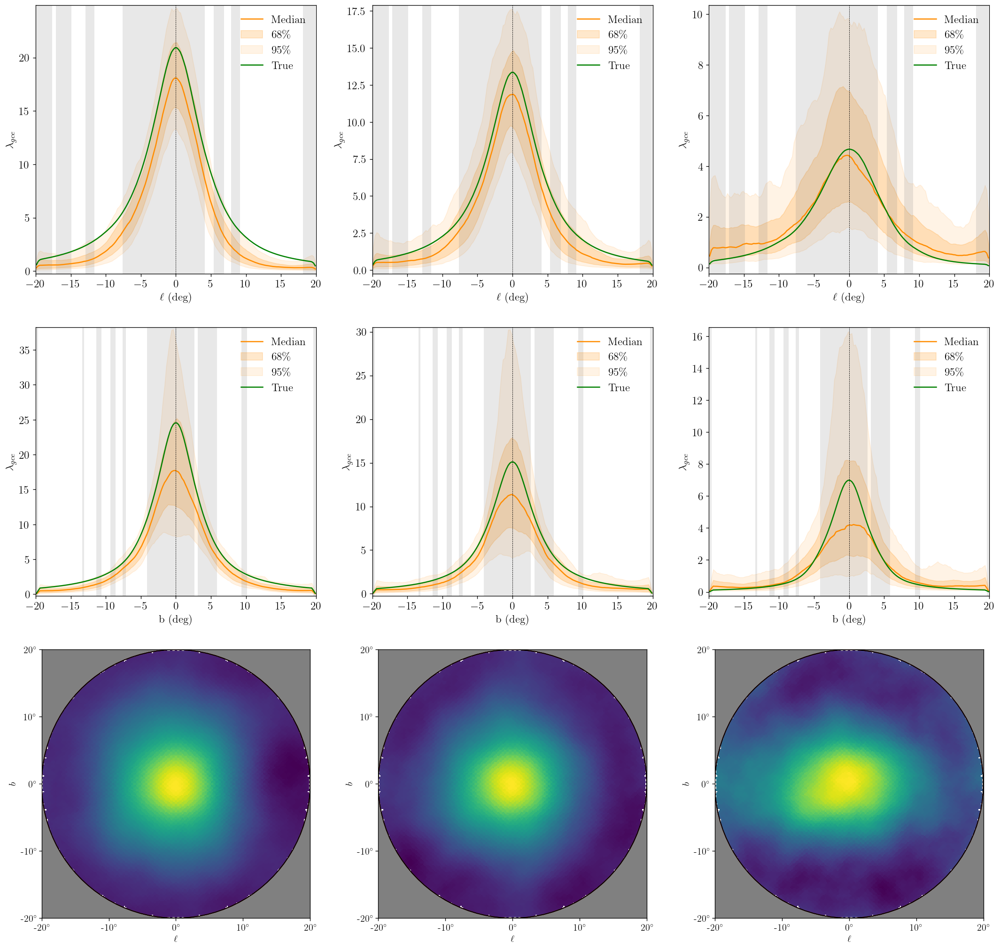

In [107]:
# plot total counts histogram for each fit
# row: different diffuse model ; column: different synthetic dataset

slice_val = 3.2  # y-value of slice

nrows = 3 ; ncols = 3
fig, axes = plt.subplots(figsize=(6*3, 6*3), dpi= 120, nrows = nrows, ncols = ncols)

c = 6
for i in range(ncols):
    mod_id = mod_ids[i]
    
    exp_gp_samples_cart = exp_gp_samples_cart_list[mod_id]
    gp_true = gp_true_cart_list[mod_id][:5938] # contains 10 copies due to carelessness when creating this

    # 1d slice of GCE
    q = np.percentile(exp_gp_samples_cart, [2.5,16,50,84,97.5], axis = 0) # cartesian sample map quantiles
    sim_cart = ef.healpix_to_cart(gp_true[:5938], mask, n_pixels = n_pixels, nside = 128) # simulated rate cartesian map
    raw_cart = None

    plt.axes(axes[0,i])
    eplt.cart_plot_1d(q, sim_cart = sim_cart, raw_cart = raw_cart, 
        slice_dir = 'horizontal', slice_val = slice_val, 
        mask_map_cart = mask_map_cart,
        n_pixels = n_pixels,
        ylabel = '$\lambda_{gce}$', q_color = 'darkorange', line_color = 'green')

    # 1d slice of GCE
    q = np.percentile(exp_gp_samples_cart, [2.5,16,50,84,97.5], axis = 0) # cartesian sample map quantiles
    sim_cart = ef.healpix_to_cart(gp_true[:5938], mask, n_pixels = n_pixels, nside = 128) # simulated rate cartesian map
    raw_cart = None

    plt.axes(axes[1,i])
    eplt.cart_plot_1d(q, sim_cart = sim_cart, raw_cart = raw_cart, 
        slice_dir = 'vertical', slice_val = slice_val, 
        mask_map_cart = mask_map_cart,
        n_pixels = n_pixels,
        ylabel = '$\lambda_{gce}$', q_color = 'darkorange', line_color = 'green')

    c += 1
    temp_sample_dict_cmask = temp_sample_dict_cmask_list[mod_id]

    plt.axes(axes[2,i])
    q = np.percentile(temp_sample_dict_cmask['gp'], 50, axis = 0)
    m = ef.convert_masked_array_to_hp_array(q, mask, log_option = True, nside = 128)
    eplt.inner_roi_map(m, title = None, vmin = None, vmax = None, subplot = int(str(nrows) + str(ncols) + str(c)), 
        cbar = False, 
        xsize = xsize)

fig.savefig('appendix_figures/fig_dif_gp_3.svg', bbox_inches='tight')

## Figure 26

Slice at y = 3.37500 deg
Slice at x = 3.37500 deg
Slice at y = 3.37500 deg
Slice at x = 3.37500 deg
Slice at y = 3.37500 deg
Slice at x = 3.37500 deg


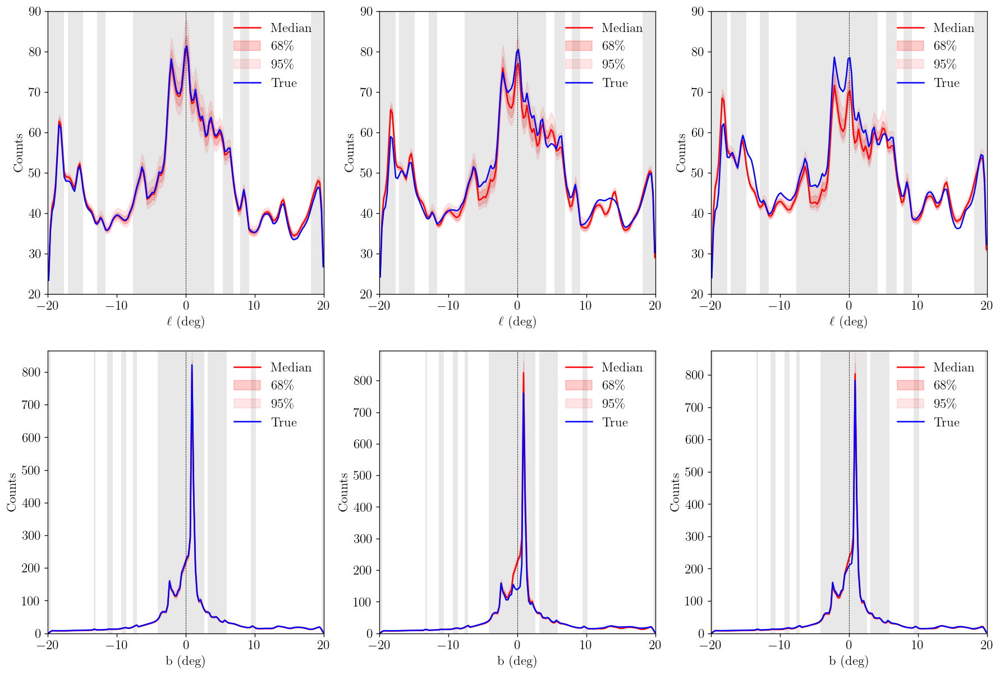

In [108]:
# plot total counts histogram for each fit
# row: different diffuse model ; column: different synthetic dataset

slice_val = 3.2  # y-value of slice

nrows = 2 ; ncols = 3
fig, axes = plt.subplots(figsize=(6*3, 6*2), dpi= 120, nrows = nrows, ncols = ncols)

for i in range(ncols):
    mod_id = mod_ids[i]

    tot_samples_cart = tot_samples_cart_list[mod_id]
    sim_cart = sim_cart_list[mod_id]

    # 1d slice of GCE
    q = np.percentile(tot_samples_cart, [2.5,16,50,84,97.5], axis = 0)
    raw_cart = None

    plt.axes(axes[0,i])
    eplt.cart_plot_1d(q, sim_cart = sim_cart, raw_cart = raw_cart, 
        slice_dir = 'horizontal', slice_val = slice_val, 
        ylim = [20., 90.],
        mask_map_cart = mask_map_cart,
        n_pixels = n_pixels,)

    plt.axes(axes[1,i])
    eplt.cart_plot_1d(q, sim_cart = sim_cart, raw_cart = raw_cart, 
        slice_dir = 'vertical', slice_val = slice_val,
        mask_map_cart = mask_map_cart,
        n_pixels = n_pixels,)

fig.savefig('appendix_figures/fig_dif_tot_3.svg', bbox_inches='tight')